# Double well toy example
In this notebook, we demonstrate the training procedure of the Differentiable Trajectory Reweighting (DiffTRe)
method. In order to outline the mechanisms behind DiffTRe, we will show the code of all important components of DiffTRe
without using the DiffTRe library.
Examples for practical applications of the DiffTRe library can be found in the notebooks on diamond or coarse-grained water.

We simulate ideal gas particles trapped inside a double well potential. We learn the external forcing of the
double well from the resulting density of ideal gas particles.


In [1]:
import jax
jax.config.update('jax_platform_name', 'cpu')  # run on cpu as tabulated potential is numerically cheap
import jax.numpy as jnp
from jax import random, vmap, jit, lax, checkpoint, value_and_grad, grad, nn, tree_util
from jax_md import simulate, space
import matplotlib.pyplot as plt
import time
from functools import partial
import optax
import pickle
from jax.scipy.stats.norm import pdf as normal_pdf
from DiffTRe import custom_interpolate
import haiku as hk
import warnings
warnings.filterwarnings('ignore')  # disable warnings about float64 usage


optimization_save_str = 'output/saved_optimization_results/Double_well_optimization.pkl'
postprocessing_str = 'output/saved_optimization_results/Double_well_postprocessing.pkl'

def plot_1d_over_x(x, z, x_label=None, y_label=None, ylim=None):
    fig, ax = plt.subplots()
    ax.plot(x, z, color='#3c5488ff')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_ylim(ylim)
    plt.show()

def plot_training_process(loss_history, x_vals, predicted_density, reference_density, cur_potential, generating_potential):
    step = len(loss_history) - 1
    middle_point = int(cur_potential.size / 2)
    shift = cur_potential[middle_point] - generating_potential[middle_point]
    shifted_potential = cur_potential - shift
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(3. * 6.4, 4.8))
    ax1.semilogy(loss_history, color='#3c5488ff')
    ax1.set_xlabel('Step')
    ax1.set_ylabel('Loss')
    ax2.plot(x_vals, predicted_density, label='Predicted density at step ' + str(step), color='#3c5488ff')
    ax2.plot(x_vals, reference_density, label='Target', linestyle='--', color='k')
    ax2.set_xlabel('$x / L$')
    ax2.set_ylabel(r'$\rho$')
    ax2.legend(loc="upper right")
    ax3.plot(x_vals, shifted_potential, label='Learned potential at step ' + str(step), color='#3c5488ff')
    ax3.plot(x_vals, generating_potential, label='Data-generating potential', linestyle='--', color='k')
    ax3.set_xlabel('$x / L$')
    ax3.set_ylabel(r'$U / k_B T$')
    ax3.set_ylim([-1, 2])
    ax3.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

### Simulation parameters
We start by defining a simulation box containing ideal gas particles at a prescribed temperature.

In [2]:
N = 2000  # ideal gas particles in the box
dt = 1.e-3
kbT = 1.
mass = 1.
box = jnp.array(1.)

### Double well potential
Let's define and plot the analytic double well potential serving as the ground-truth system generating the target
particle density.

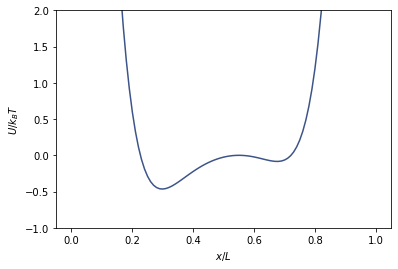

In [3]:
def analytic_double_well(x):
    double_well = 2500 * (x - 0.5)**6 - 10 * (x - 0.55)**2
    return kbT * double_well

resolution = 100
x_vals = jnp.linspace(0., box, resolution + 1)
vectorized_analytic_double_well = vmap(analytic_double_well)

analytic_potential_vals = vectorized_analytic_double_well(x_vals)
plot_1d_over_x(x_vals, analytic_potential_vals, x_label='$x / L$', y_label='$U / k_BT$', ylim=[-1, 2])

## Reference Simulation

Next, we run a simulation using the analytic double well potential to generate a long trajectory for our
toy problem.

In [4]:
# initialize particles
position_key, model_key, simuation_key = random.split(random.PRNGKey(0), 3)
R_init = box * random.uniform(position_key, (N, 1))

def analytic_energy_fn(R, t=0):
    """Ideal gas particles don't interact. The energy results merely from the position in the box."""
    energies = vectorized_analytic_double_well(R)
    return jnp.sum(energies)

_, shift = space.periodic(box)
init, apply = simulate.nvt_nose_hoover(analytic_energy_fn, shift, dt, kbT, chain_steps=1, tau=20*dt)
init_state = init(simuation_key, R_init)

def run_to_next_printout_fn(apply_fn, n_steps_per_printout):
    """Helper function to sample a specified number of snapshots."""
    do_step = lambda state, t: (apply_fn(state), ())

    @jit
    def run_small_simulation(start_state, dummy_carry):
        printout_state, _ = lax.scan(do_step, start_state, xs=jnp.arange(n_steps_per_printout))
        return printout_state, printout_state

    return run_small_simulation

run_to_printout = run_to_next_printout_fn(apply, n_steps_per_printout=100)

t_start = time.time()
state, _ = lax.scan(run_to_printout, init_state, xs=jnp.arange(10000))  # dump first 10000 printouts as equilibration
_, reference_traj = lax.scan(run_to_printout, state, xs=jnp.arange(100000))  # sample 100000 snapshots
reference_traj.position.block_until_ready()
print('Time for generating reference dataset:', time.time() - t_start, 's')

Time for generating reference dataset: 138.2388894557953 s


## Density function

In top-down learning of potential energy functions, the goal is to match the simulation output to some experimental data.
For this toy example, we want to match the normalized density of ideal gas particles.
We can compute the normalized density directly from the trajectory we just generated.

In order to compute gradients for DiffTRe, we need to make sure quantities of interest are differentiable functions.
Discrete binning classically used to compute densities or structural correlations is not differentiable. To preserve
differentiability, we substitute the discrete binning by sums over narrow Gaussians centered at particle positions.


In [5]:
# map over Gaussian mean values to compute contribution of multiple particles simultaneously
vectorized_normal_pdf = vmap(normal_pdf, (None, 0, None))

# the (discrete) integral over a PDF is 1 making sure that the contribution of each single particle
# is 1 as in the case of discrete binning
dx_bin = (x_vals[1] - x_vals[0])  # bin size in x direction; assuming a homogeneous grid

def init_normalised_density_fn(x_vals, dx_bin):
    """
    Initializes a function that computes the normalized density given simulation states.
    We approximate the discrete Dirac function used for binning by a Gaussian to have a differentiable function.
    Note that multiplication with dx_bin cancels with subsequent division due to normalization.
    """

    @jit
    def normalized_density(R):
        pdf_vals = vectorized_normal_pdf(x_vals, R, dx_bin)
        return jnp.mean(pdf_vals, axis=0)

    return normalized_density

normalized_density_fn = init_normalised_density_fn(x_vals, dx_bin)

Let's use the normalized density function to compute the target density from the analytic
double well potential.

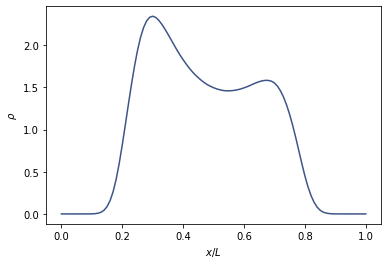

In [6]:
def compute_quantity_traj(traj, quantity_fn):
    """
    Helper function applying a quantity function onto each state in the trajectory.
    """

    def quantity_trajectory(dummy_carry, state):
        R = state.position
        quantity = quantity_fn(R)
        return dummy_carry, quantity

    _, quantity_traj = lax.scan(quantity_trajectory, 0., traj)
    return quantity_traj

target_density = compute_quantity_traj(reference_traj, normalized_density_fn)
target_density = jnp.mean(target_density, axis=0)  # average over all trajectory snapshots

plot_1d_over_x(x_vals, target_density, x_label='$x / L$', y_label=r'$\rho$')

## Learning MD potentials via DiffTRe

In short, DiffTRe relies on the fact that the probability of sampling any given state under a specific potential is known. For NVT MD simulations,
state probabilities are given by the Boltzmann distribution. In this case, the probability of sampling any given state
$S_i$ is defined by its total energy $H$:

$$p_{\theta}(S_i) \sim e^{\beta H(S_i)} \ ,$$

where $\beta = \frac{1}{k_B T}$The ratio of probabilities of a given state $S_i$ under two different potential energy functions parametrized by
$\theta$ and $\hat \theta$ is therefore

$$\frac{p_{\theta}(S_i)}{p_{\hat \theta}(S_i)} = e^{-\beta U_{\theta}(S_i) - U_{\hat \theta}(S_i)} \ .$$

Note that the kinetic energy cancels as it is fixed by the state and independent of the potential energy function.
From the probability ratio, the states in the reference trajectory can be reweighted to reflect their
probabilities under the new potential.
This allows computing ensemble averaged quantities of interest $O$ under the new potential $\theta$ from reference
trajectory states generated from $\hat \theta$:

$$\langle O \rangle_{\theta} \simeq \sum_{i=1}^N w_i O(S_i, U_{\theta}) \quad \mathrm{with} \quad
w_i =\frac{e^{-\beta (U_{\theta}(S_i) - U_{\hat \theta}(S_i)) }}{\sum_{i=j}^N e^{-\beta (U_{\theta}(S_j) -
 U_{\hat \theta}(S_j)) }} . $$

The normalization of weights $w_i$ guarantees a proper average as $\sum_{i=1}^n w_i = 1$.
Note that $w_i = 1/N \mathrm{\ if\ } U_{\theta} = U_{\hat \theta}$, consistent with usual averages.


The reweighting ansatz serves two main purposes:
1. Link between $\theta$ and $\langle O \rangle$: As the set of decorrelated states allows computation of quantities of interest, reweighting establishes a
   direct link between $\theta$ and a quantity of interest $\langle O \rangle$.
   This allows building a loss function $L(\theta)$ of $\langle O \rangle$ and its target value $O^\mathrm{exp}$.
   Taking the derivative of $L(\theta)$ wrt. $\theta$ via automatic differentiation enables learning MD
   potentials that generate target quantities of interest.
2. Computational efficiency: Computing the gradient is cheap as the energy and quantity functions only need to be
   applied to decorrelated states, which are around 2 orders of magnitude less states than during sampling
   of the reference trajectory.
   Furthermore, multiple gradient computations and parameter updates per reference trajectory are possible.
   In order to use the same trajectory multiple times, the effective trajectory sample size $N_\mathrm{eff}$ must
   be larger than a threshold $\bar N_\mathrm{eff}$.

The main limiting factor of the reweighting ansatz is reduction in $N_\mathrm{eff}$ as $U_{\theta}$ becomes increasingly
different from $U_{\hat \theta}$. This causes weights $w_i$ to deviate from their mean $1/N$, such that many $w_i$ approach 0,
adding little to the average. When few reweighted states dominate the average, this increases the statistical error in
$\langle O \rangle$. If the statistical error is too large, i.e. $N_\mathrm{eff} < \bar N_\mathrm{eff}$,
a new reference trajectory needs to be sampled using $U_{\theta}$. $N_\mathrm{eff}$ can be estimated as

$$N_\mathrm{eff} \approx e^{-\sum_{i=1}^n w_i \log w_i}\ .$$

For a more detailed account of the method, please refer to the paper.

The first step of DiffTRe requires the definition of a MD potential with learnable parameters $\theta$.
We choose a cubic spline as a flexible function to approximate the analytic double well.

In [7]:
def spline_potential(x_vals, energy_params):
    spline = custom_interpolate.MonotonicInterpolate(x_vals, energy_params)
    v_spline = vmap(spline)

    def spline_energy_fn(R):
        energies = v_spline(R)
        return jnp.sum(energies)
    return spline_energy_fn

Next to the learnable spline, we define a prior potential serving as an advantageous starting point for the
optimization. A well-chosen prior speeds up learning significantly.
For this toy example, we use a harmonic single-well potential as our prior. This encodes the prior knowledge that
particles cannot escape the target double-well.

In [8]:
def prior_energy(confinement_x):
    def single_well(x):
        harmonic_confinement_x = confinement_x * (x - 0.5) ** 2
        return harmonic_confinement_x

    vectorized_single_well = vmap(single_well)

    def prior_energy_fn(R):
        energies = vectorized_single_well(R)
        return jnp.sum(energies)

    return prior_energy_fn

prior_fn = prior_energy(75.)

Next, we need to define flexible `energy_fn` and `simulator` templates such that we can change the energy function
on-the-fly and take gradients wrt. energy parameters.

In [9]:
spline_grid = jnp.linspace(0., 1., 50)

def energy_fn_template(params):
    spline = spline_potential(spline_grid, params)

    def energy_initialized(R, t=0):
        return spline(R) + prior_fn(R)
    return jit(energy_initialized)

# We can "bake in" constant simulation parameters using `partial`. Calling simulator_template with a new
# energy_fn then initializes a new simulator function.
simulator_template = partial(simulate.nvt_nose_hoover, shift_fn=shift, dt=dt, kT=kbT, chain_steps=1, tau=20*dt)

# initialize network and simulation
init_params = 0.01 * random.normal(model_key, spline_grid.shape)
energy_fn_init = energy_fn_template(init_params)
init_sim, apply_fn = simulator_template(energy_fn_init)
init_state = init_sim(simuation_key, R_init, mass=mass)

### DiffTRe core functions

`generate_reference_trajectory` generates a new trajectory using the current energy parameters.
It also computes reference potential values $U_{\hat \theta}(S_i)$ for all decorrelated states $S_i$ needed for computation
of weights $w_i$ later on.

In [10]:
timesteps_per_printout = 100
num_dumped = 1000
num_printouts_production = 10000

@jit
def generate_reference_trajectory(params, sim_state):
    # initialize simulation with current params / energy_fn
    energy_fn = energy_fn_template(params)
    _, apply_fn = simulator_template(energy_fn)
    run_small_simulation = run_to_next_printout_fn(apply_fn, timesteps_per_printout)

    # run simulation and compute energies
    sim_state, _ = lax.scan(run_small_simulation, sim_state, xs=jnp.arange(num_dumped))  # equilibrate
    new_sim_state, traj = lax.scan(run_small_simulation, sim_state, xs=jnp.arange(num_printouts_production))
    U_traj = compute_quantity_traj(traj, energy_fn)

    return new_sim_state, traj, U_traj

The next function computes $w_i$ and $N_\mathrm{eff}$:

In [11]:
def compute_weights(params, traj_state):
    def estimate_effective_samples(weights):
        weights = jnp.where(weights > 1.e-10, weights, 1.e-10)  # mask to avoid NaN from log(0) if a few weights are 0.
        exponent = - jnp.sum(weights * jnp.log(weights))
        return jnp.exp(exponent)

    _, trajectory, U_traj = traj_state

    # cannot save whole energy computation for backward pass to memory: need checkpointing
    energy_fn = checkpoint(energy_fn_template(params))
    # compute energies of reference trajectory using the new potential
    U_traj_new = compute_quantity_traj(trajectory, energy_fn)

    # difference in pot. energy is difference in total energy as kinetic energy is the same and cancels
    exponent = -(1. / kbT) * (U_traj_new - U_traj)
    # Note: The reweighting scheme is a softmax, where the exponent above represents the logits.
    #       To improve numerical stability and guard against overflow it is good practice to subtract
    #       the max of the exponent using the identity softmax(x + c) = softmax(x). With all values
    #       in the exponent <=0, this rules out overflow and the 0 value guarantees a denominator >=1.
    exponent -= jnp.max(exponent)
    prob_ratios = jnp.exp(exponent)
    weights = prob_ratios / jnp.sum(prob_ratios)
    n_eff = estimate_effective_samples(weights)
    return weights, n_eff

We can now define the loss function.
This is the only instance where target data enters DiffTRe in the
form of the `target_density`. Note that existence of a ground-truth model as in this toy example is not necessary for DiffTRe.
Target data can also be obtained directly from other sources, including experimental
data, as demonstrated by the notebooks on diamond and coarse-grained water.

The `loss_fn` receives the quantities $O(S_i)$ for each snapshot $S_i$ (here $\rho(S_i)$), computes averaged
observables $\langle O(S_i) \rangle$ using corresponding weights $w_i$ and outputs the resulting (MSE) loss value.
This function also returns the predicted density distribution for visualization purposes.

In [12]:
def mse_loss(predictions, targets):
    """Computes mean squared error loss for given predictions and targets."""
    squared_difference = jnp.square(targets - predictions)
    mean_of_squares = jnp.sum(squared_difference) / predictions.size
    return mean_of_squares

def loss_fn(density_traj, weights):
    weighted_densities = (density_traj.T * weights).T  # weight each snapshot
    predicted_density_ensemble_average = jnp.sum(weighted_densities, axis=0)  # weights account for "averaging"
    loss = mse_loss(predicted_density_ensemble_average, target_density)
    return loss, predicted_density_ensemble_average

We've created all building blocks of DiffTRe now. Let's combine them to build the propagation function that
handles computation of gradients and generation of new reference trajectories when necessary.

In [13]:
@jit
def reweighting_loss(params, traj_state):
    """
    Computes the loss using the DiffTRe formalism and additionally return predictions of the current model.
    """
    weights, _ = compute_weights(params, traj_state)
    _, traj, _ = traj_state
    density_traj = compute_quantity_traj(traj, normalized_density_fn)
    loss, predictions = loss_fn(density_traj, weights)
    return loss, predictions

def propagation_fn(params, traj_state, reweight_ratio=0.9):

    def trajectory_identity_mapping(input):
        """Helper function to re-use trajectory if no recomputation is necessary"""
        _, traj_state = input
        return traj_state

    def recompute_trajectory(input):
        """Recomputes the reference trajectory, starting from the last state of the previous trajectory,
        saving equilibration time."""
        params, traj_state = input
        sim_state = traj_state[0]
        updated_traj_state = generate_reference_trajectory(params, sim_state)
        return updated_traj_state

    # check if trajectory re-use is possible; recompute trajectory if not
    weights, n_eff = compute_weights(params, traj_state)
    n_snapshots = traj_state[2].size
    recompute = n_eff < reweight_ratio * n_snapshots
    traj_state = lax.cond(recompute, recompute_trajectory, trajectory_identity_mapping, (params, traj_state))

    outputs, curr_grad = value_and_grad(reweighting_loss, has_aux=True)(params, traj_state)
    loss_val, predicted_density = outputs

    return traj_state, curr_grad, loss_val, predicted_density

In order to take advantage of computed gradients, we have to define an optimizer. Here, we select an Adam optimizer with quadratic learning
rate decay. The hyperparameters $b_1$ and $b_2$ for exponentially decaying averages are chosen to account for training
with rather large step sizes and only few parameter updates. In this case, past gradients are not as informative
as when training with standard mini-batch gradient descent.

In [14]:
initial_lr = 0.5
lr_schedule = optax.exponential_decay(-initial_lr, 200, 0.01)
optimizer = optax.chain(
    optax.scale_by_adam(0.1, 0.4),
    optax.scale_by_schedule(lr_schedule)
)

The only function we need to interact with during training is `update`. With each call, it updates $\theta$ via the
optimizer using the loss gradient computed from the `propagation_fn`. It outputs quantities to monitor training progress.

For real-world applications, this is the function that will be provided by `DiffTRe_init` from the DiffTRe library.
You won't need to define all these DiffTRe functions yourself, of course. You can check out the other two notebooks that
demonstrate the simplicity of applying DiffTRe.

In [15]:
@jit
def update(params, opt_state, traj_state):
    traj_state, curr_grad, loss_val, predicted_density = propagation_fn(params, traj_state)
    scaled_grad, opt_state = optimizer.update(curr_grad, opt_state, params)
    new_params = optax.apply_updates(params, scaled_grad)
    return new_params, opt_state, traj_state, curr_grad, loss_val, predicted_density

Now we can start the optimization.
We have to start by generating the first reference trajectory. We can already compute the initial predicted density.
Note that the spline is initialized close to 0. Therefore, the predicted density almost exclusively reflects  the choice
of prior.

Time for initial reference trajectory generation 88.33388161659241 s


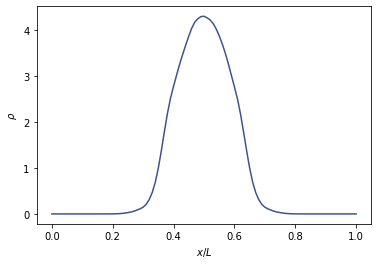

In [16]:
t_start = time.time()
init_traj_state = generate_reference_trajectory(init_params, init_state)
init_traj_state[0].position.block_until_ready()
print('Time for initial reference trajectory generation', time.time() - t_start, 's')

initial_traj = init_traj_state[1]
initial_density_traj = compute_quantity_traj(initial_traj, normalized_density_fn)
initial_density = jnp.mean(initial_density_traj, axis=0)

plot_1d_over_x(x_vals, initial_density, x_label='$x / L$', y_label=r'$\rho$')

In [17]:
def potential_over_x(params):
    """Helper function to compute the current potential energy over x, including the prior."""
    energy_fn = energy_fn_template(params)

    def pot_fn(R):
        R = jnp.expand_dims(R, 0)
        return energy_fn(R)

    return vmap(pot_fn)(jnp.expand_dims(x_vals, -1))

Now we can iteratively call `update_fn` to learn the double-well potential.
We can monitor the loss, the predicted density and the current potential energy during training.
You can load the results in the next cell in case you don't want to wait for the optimization.

At the start of the optimization, update steps are rather large, thereby significantly reducing $N_\mathrm{eff}$ and hence
 triggering a new trajectory generation with each parameter update. Over the course of the simulation,
 changes to the potential become smaller and multiple updates are possible for a single trajectory.

Step 0 in 9.14 sec loss =  1.7622513 



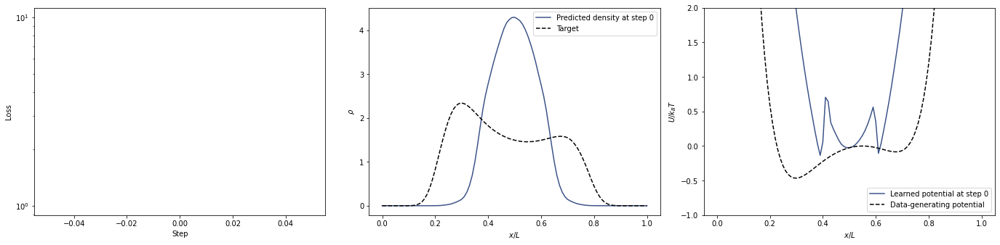

Step 1 in 39.03 sec loss =  1.0445483 



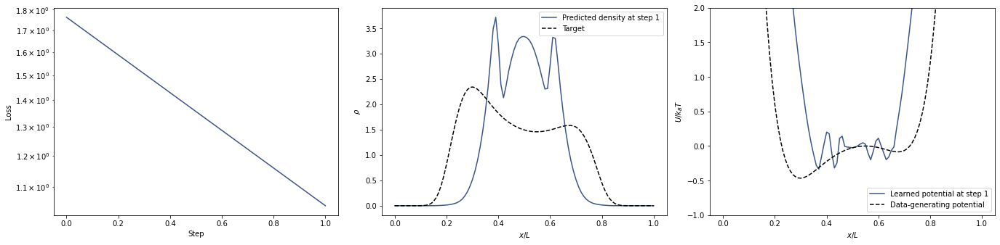

Step 2 in 39.65 sec loss =  0.6686244 



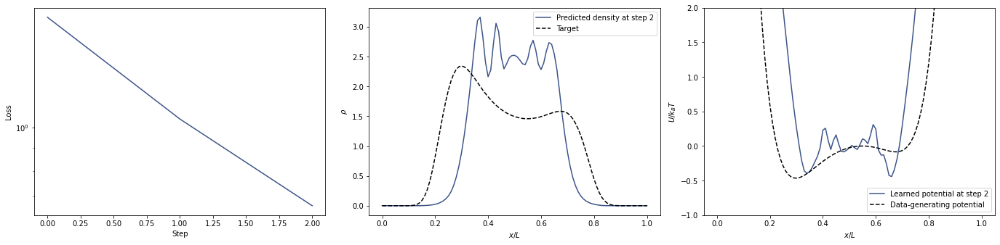

Step 3 in 39.53 sec loss =  0.42615607 



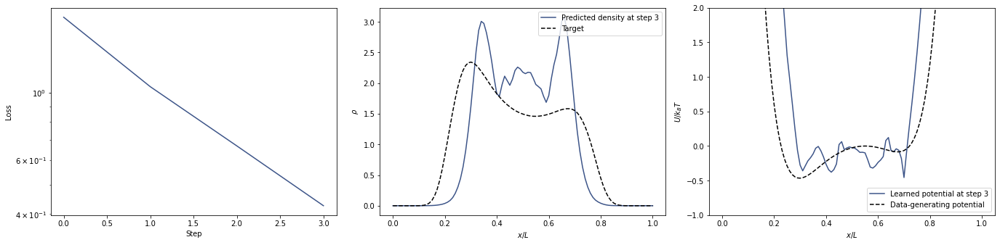

Step 4 in 39.64 sec loss =  0.27631664 



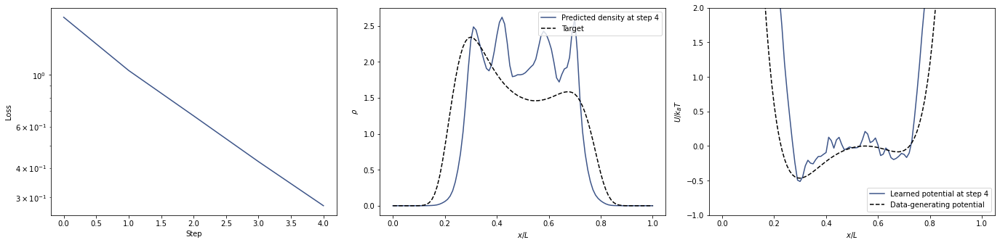

Step 5 in 39.69 sec loss =  0.13696969 



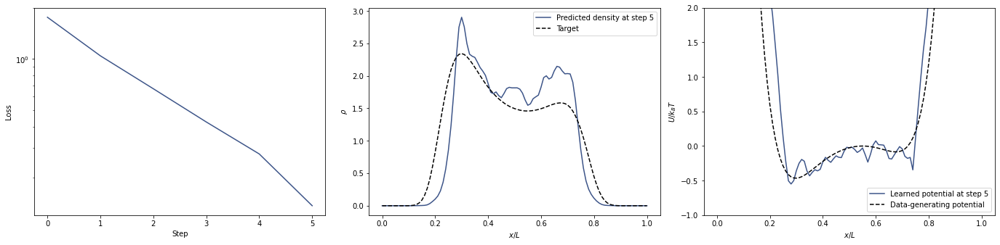

Step 6 in 39.53 sec loss =  0.07355172 



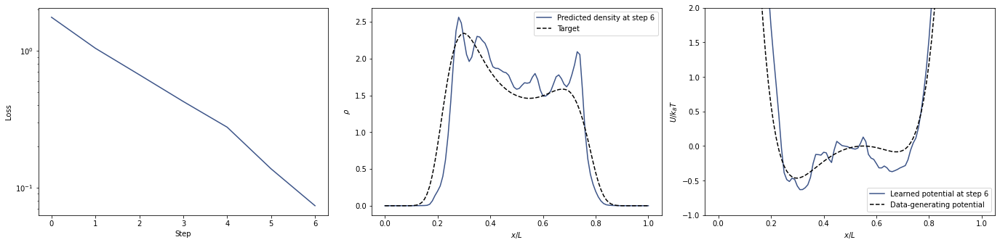

Step 7 in 38.96 sec loss =  0.050141536 



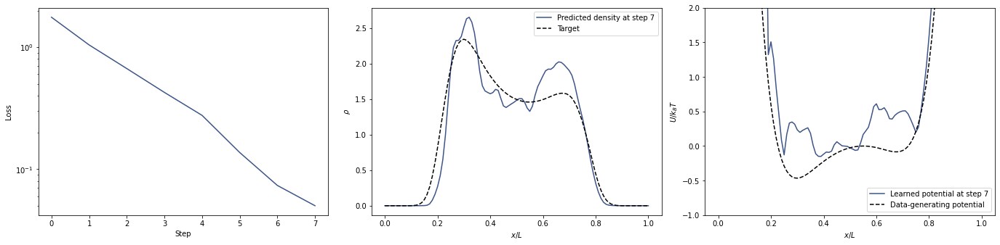

Step 8 in 39.11 sec loss =  0.10556533 



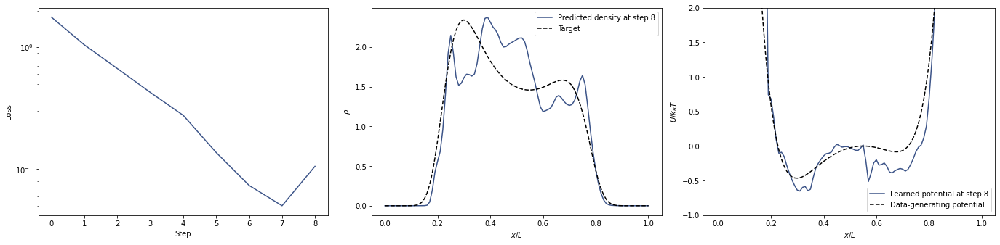

Step 9 in 39.96 sec loss =  0.038041685 



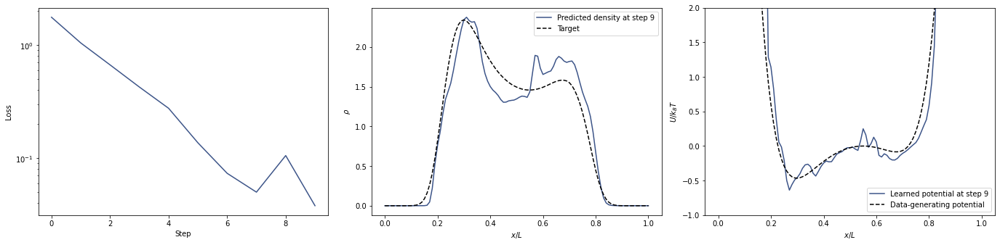

Step 10 in 39.65 sec loss =  0.023783391 



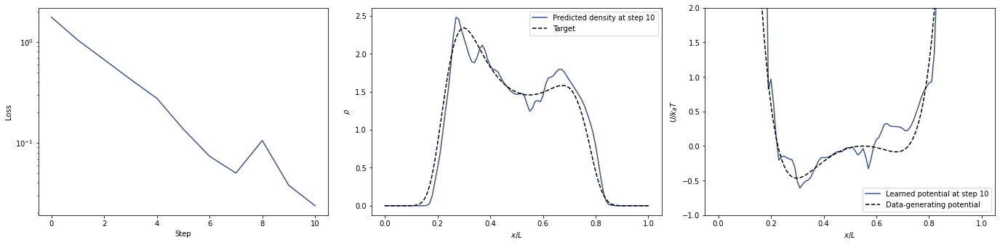

Step 11 in 39.34 sec loss =  0.03629295 



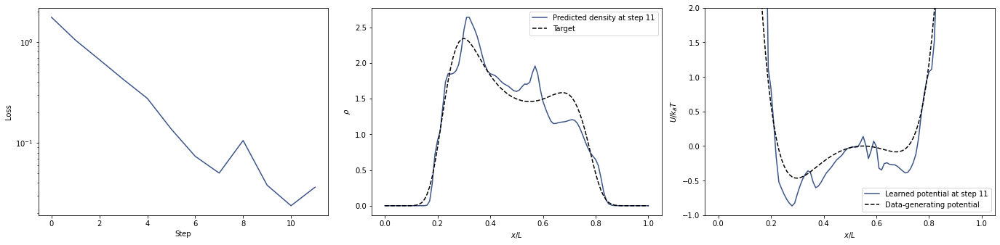

Step 12 in 39.58 sec loss =  0.038882844 



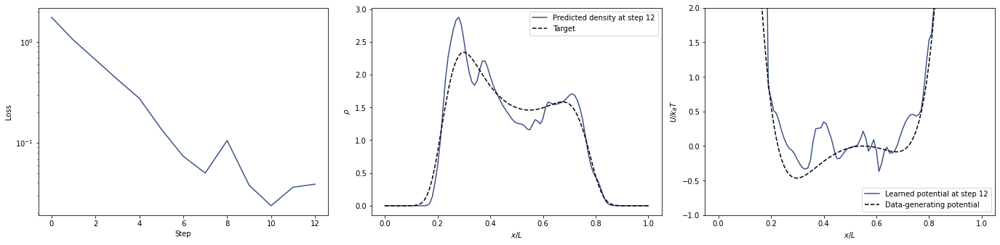

Step 13 in 39.20 sec loss =  0.055333648 



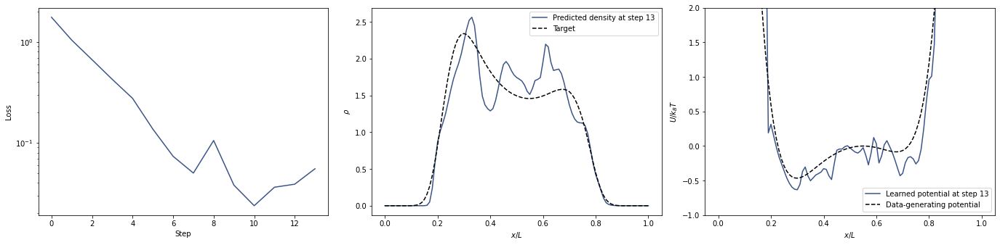

Step 14 in 39.41 sec loss =  0.024100456 



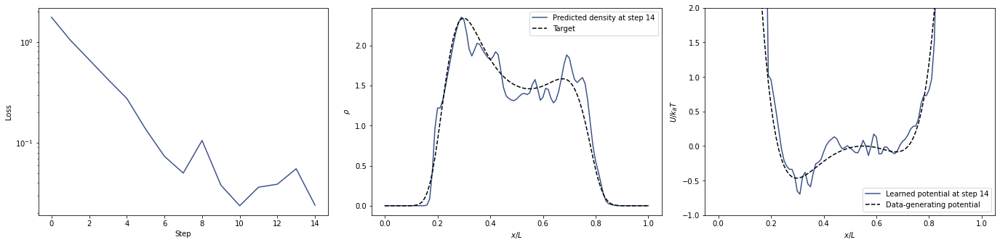

Step 15 in 38.85 sec loss =  0.021959009 



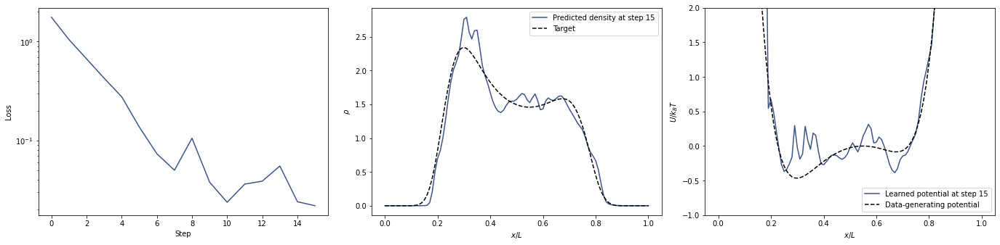

Step 16 in 39.09 sec loss =  0.056613375 



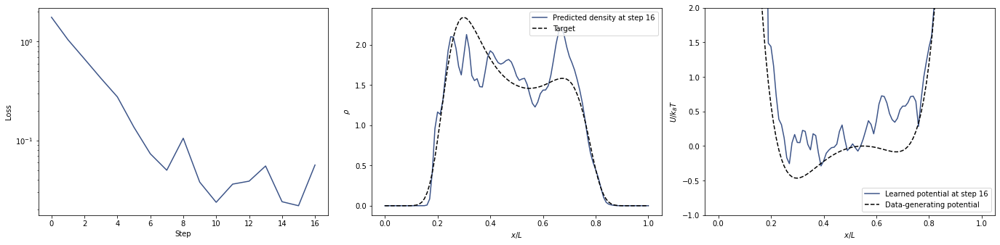

Step 17 in 39.08 sec loss =  0.07766781 



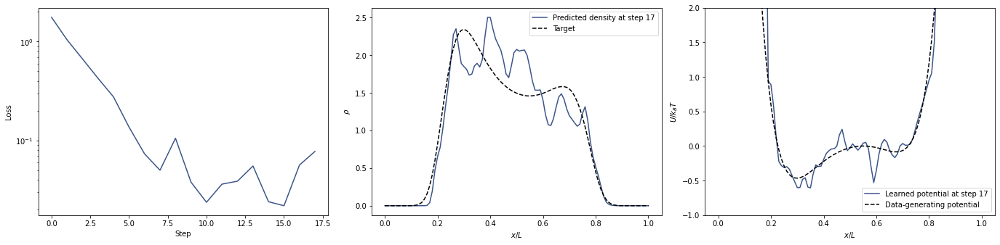

Step 18 in 38.95 sec loss =  0.022548303 



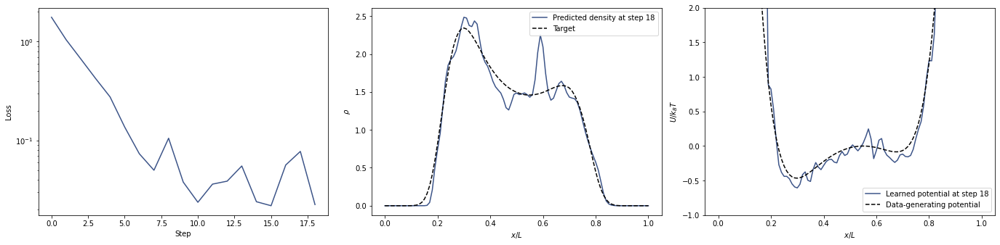

Step 19 in 38.61 sec loss =  0.007542461 



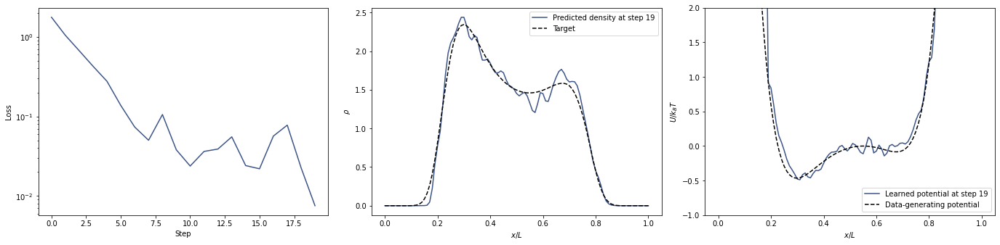

Step 20 in 38.92 sec loss =  0.010367713 



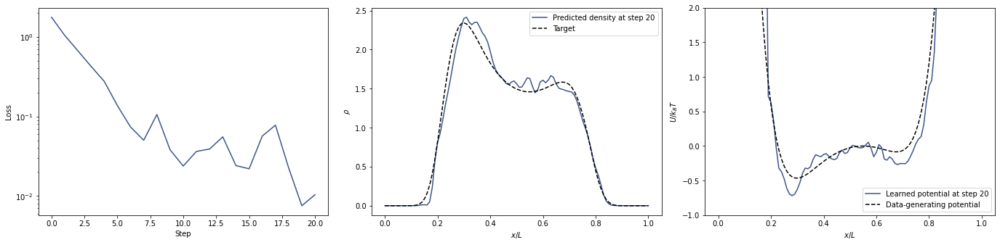

Step 21 in 39.33 sec loss =  0.025439177 



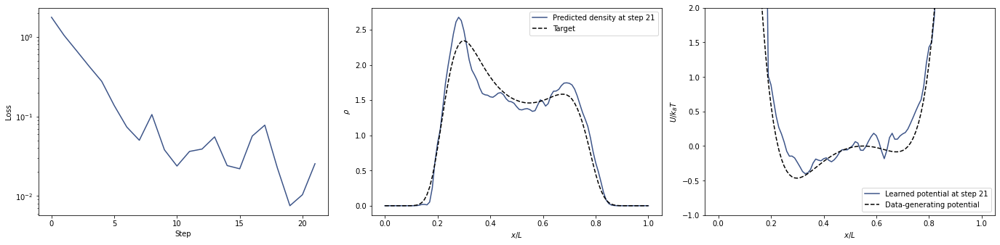

Step 22 in 39.24 sec loss =  0.026629318 



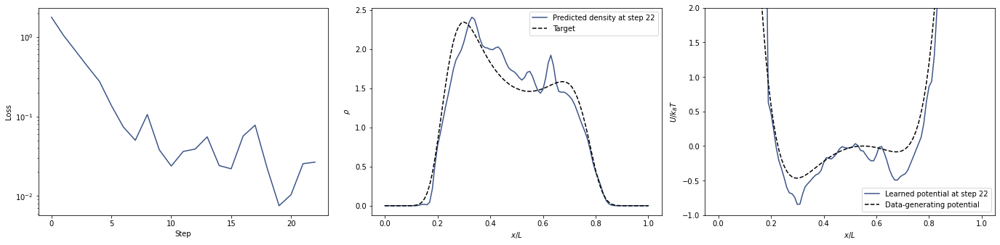

Step 23 in 39.08 sec loss =  0.027213434 



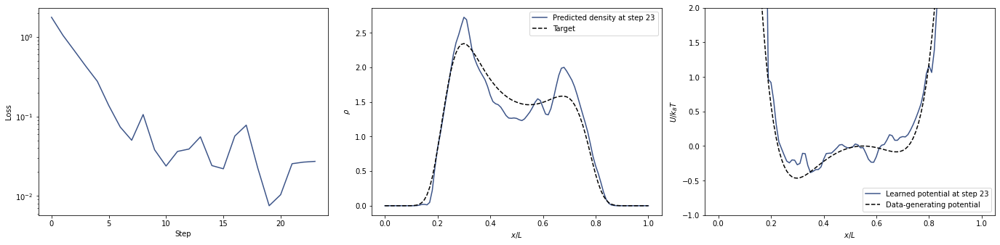

Step 24 in 39.02 sec loss =  0.025228295 



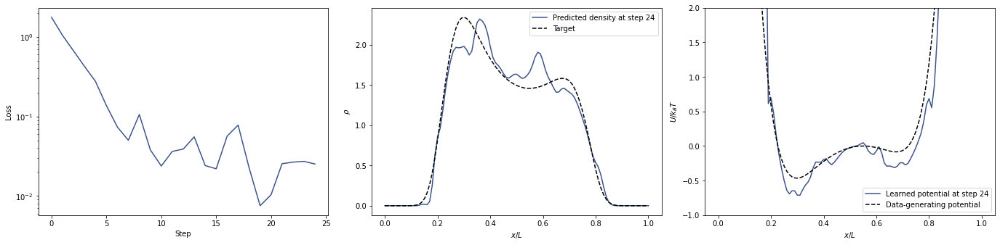

Step 25 in 38.71 sec loss =  0.017377025 



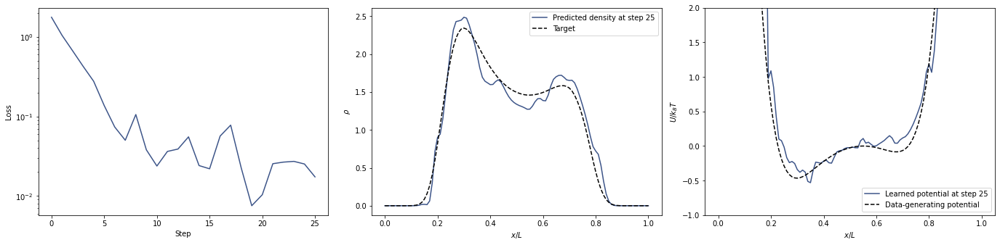

Step 26 in 39.68 sec loss =  0.018242352 



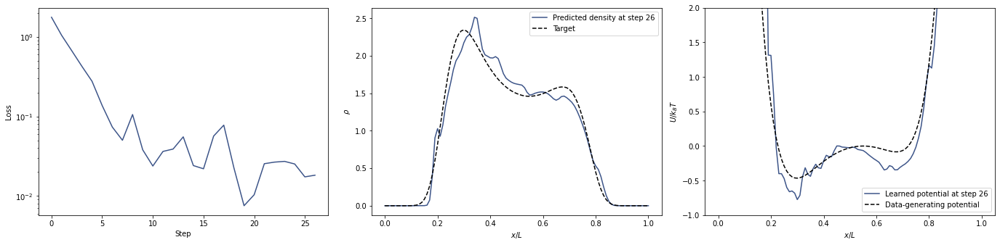

Step 27 in 39.25 sec loss =  0.024848623 



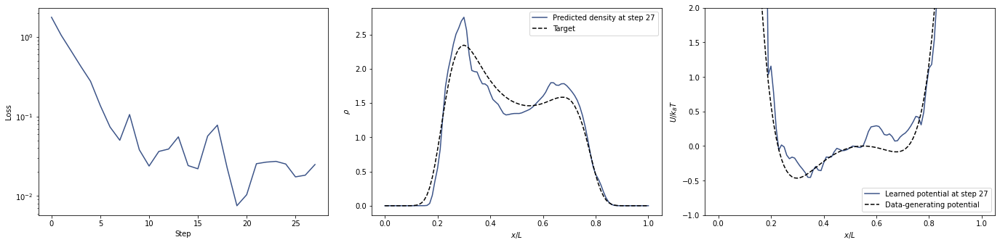

Step 28 in 39.43 sec loss =  0.025288962 



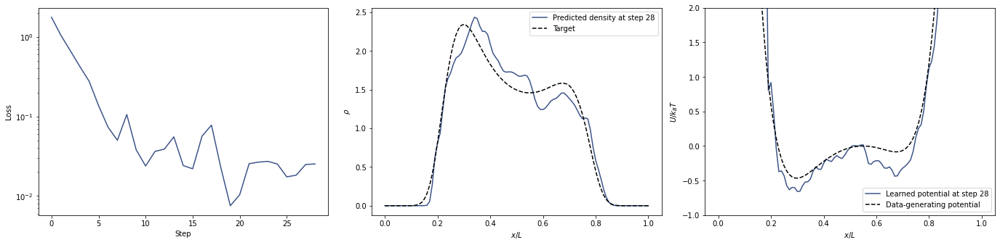

Step 29 in 39.49 sec loss =  0.015221773 



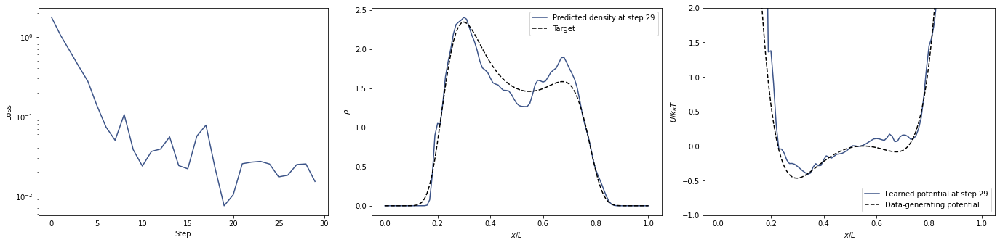

Step 30 in 39.25 sec loss =  0.012605103 



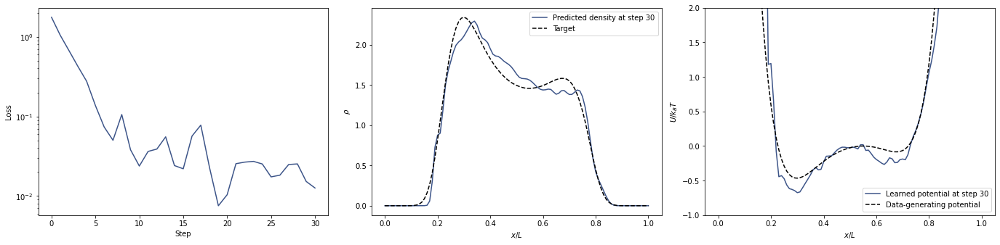

Step 31 in 39.77 sec loss =  0.015987922 



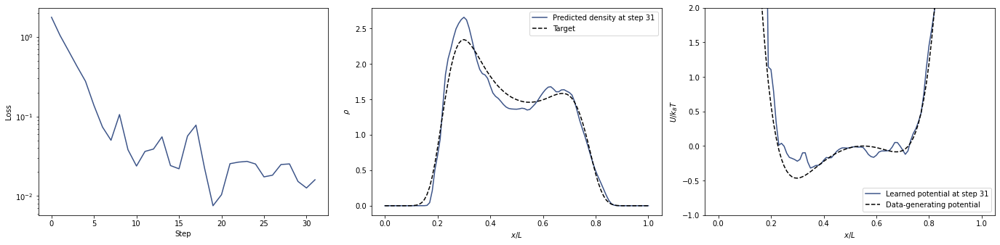

Step 32 in 39.66 sec loss =  0.026103208 



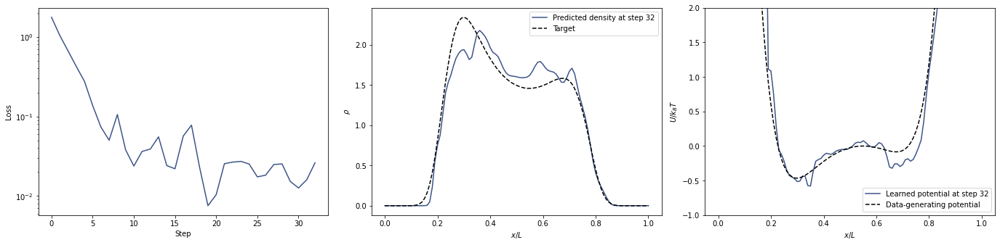

Step 33 in 39.08 sec loss =  0.02423331 



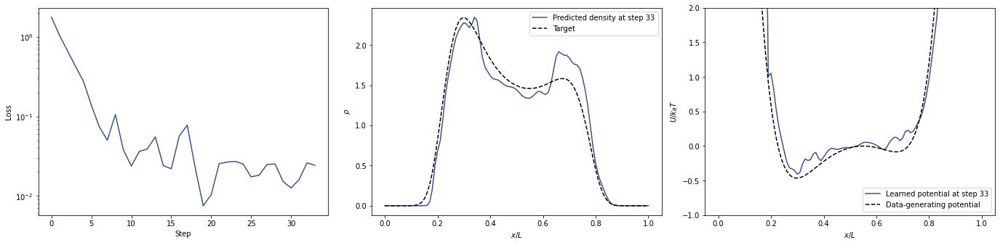

Step 34 in 38.87 sec loss =  0.013398768 



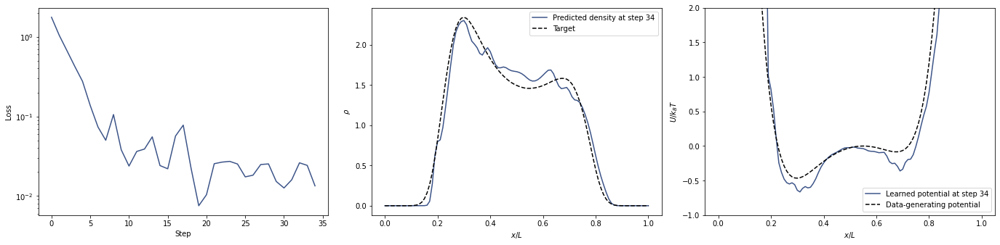

Step 35 in 38.96 sec loss =  0.012826815 



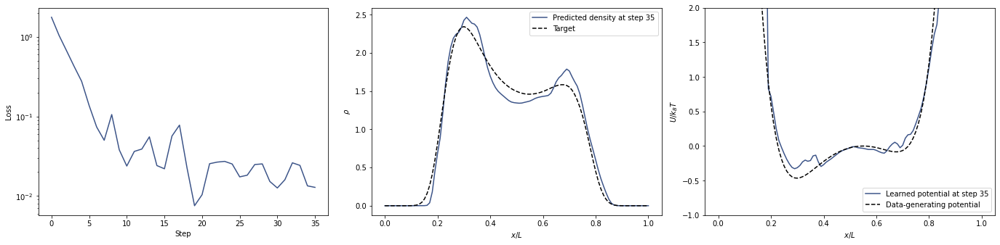

Step 36 in 39.16 sec loss =  0.013146459 



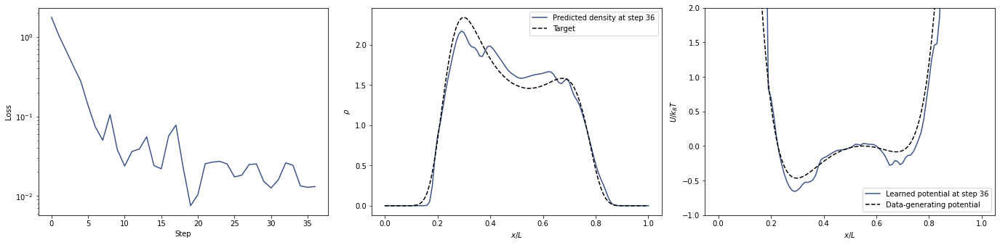

Step 37 in 38.91 sec loss =  0.012629712 



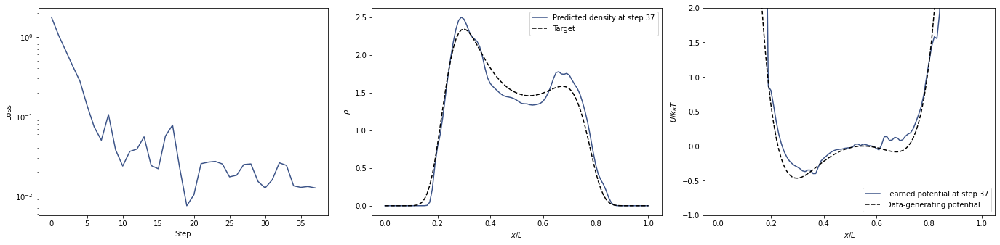

Step 38 in 38.81 sec loss =  0.013525998 



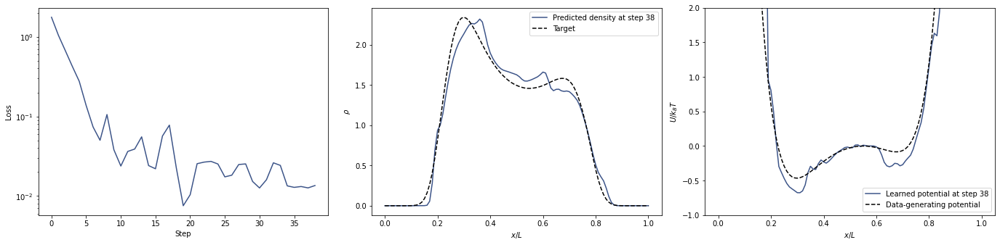

Step 39 in 39.30 sec loss =  0.015627587 



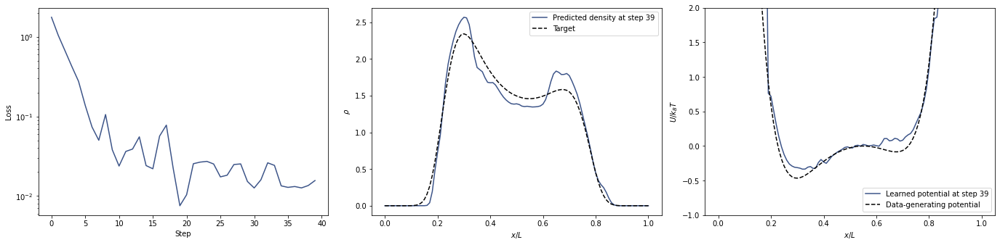

Step 40 in 39.52 sec loss =  0.008075607 



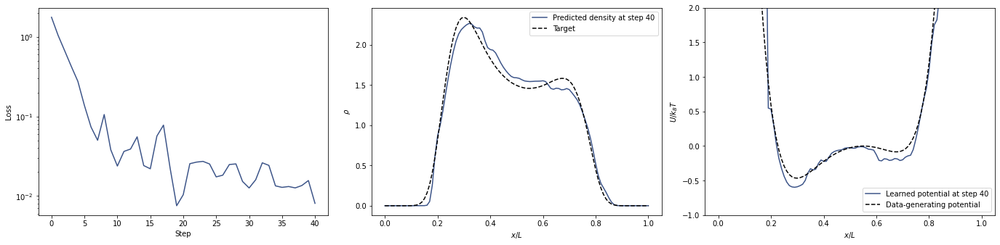

Step 41 in 40.07 sec loss =  0.0082932 



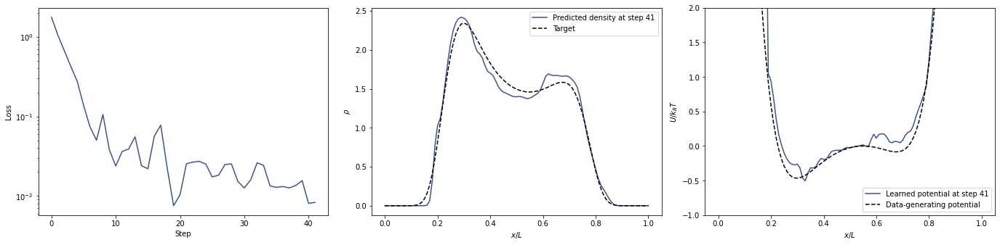

Step 42 in 39.76 sec loss =  0.011091198 



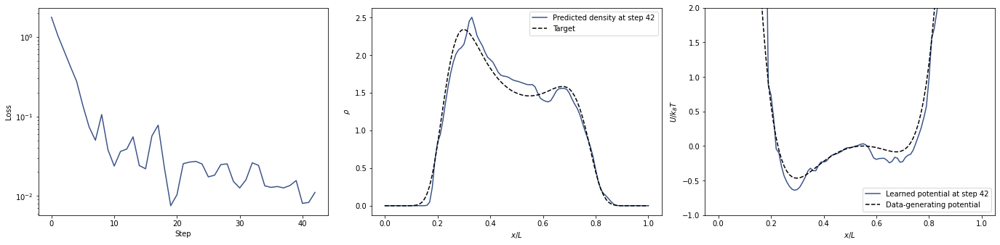

Step 43 in 39.74 sec loss =  0.00813053 



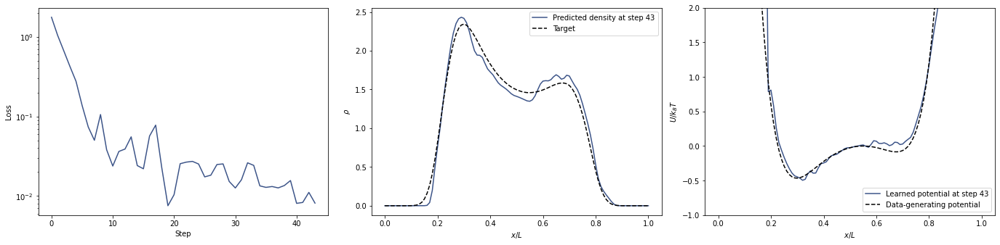

Step 44 in 39.28 sec loss =  0.0052571693 



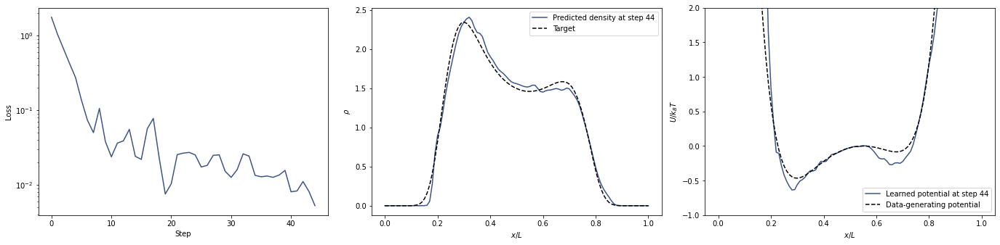

Step 45 in 38.72 sec loss =  0.011141865 



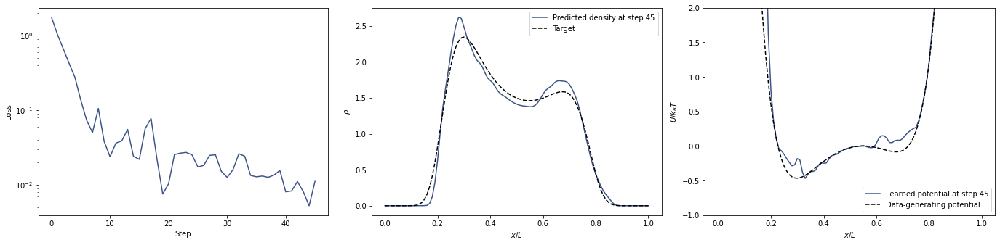

Step 46 in 39.06 sec loss =  0.015975319 



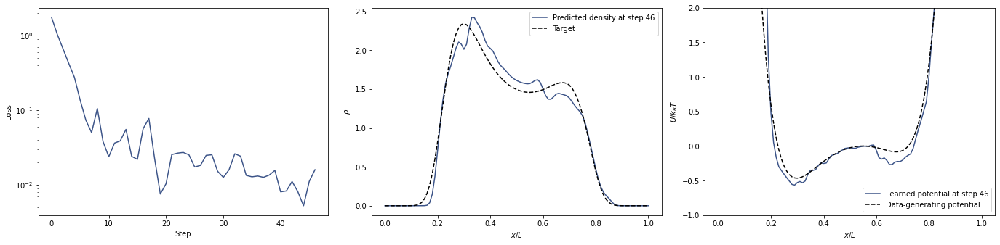

Step 47 in 39.24 sec loss =  0.008091407 



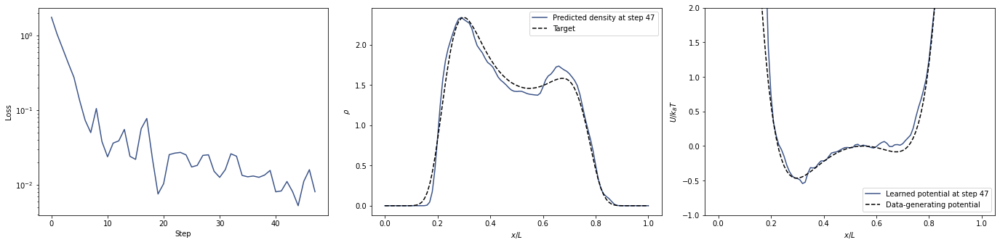

Step 48 in 38.49 sec loss =  0.0063727545 



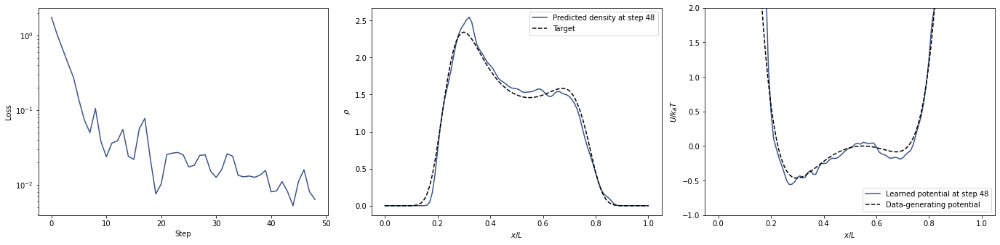

Step 49 in 38.12 sec loss =  0.0053241304 



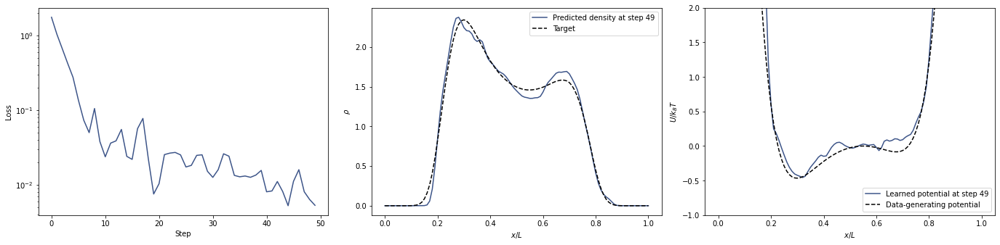

Step 50 in 39.14 sec loss =  0.0071300035 



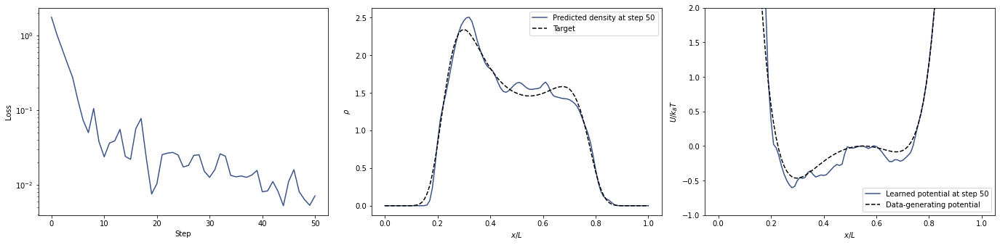

Step 51 in 39.51 sec loss =  0.008705302 



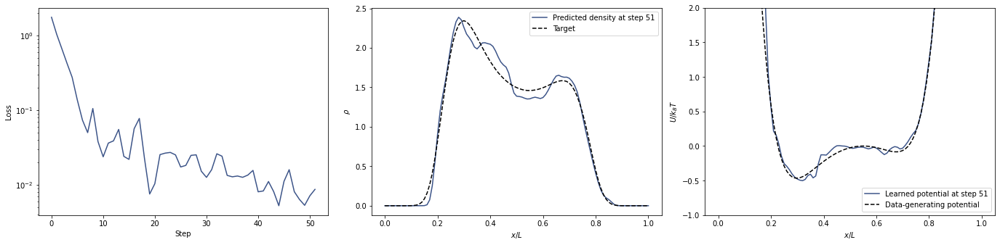

Step 52 in 39.96 sec loss =  0.004137009 



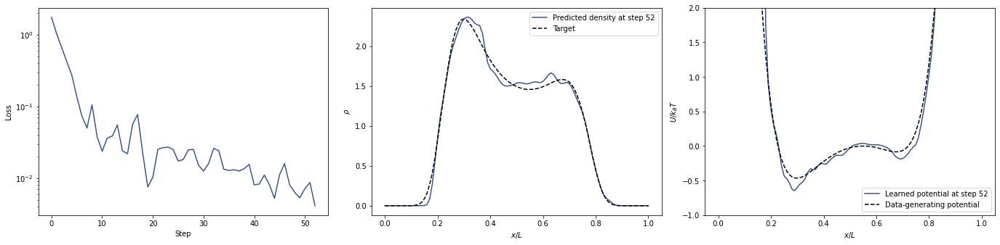

Step 53 in 39.12 sec loss =  0.0066074096 



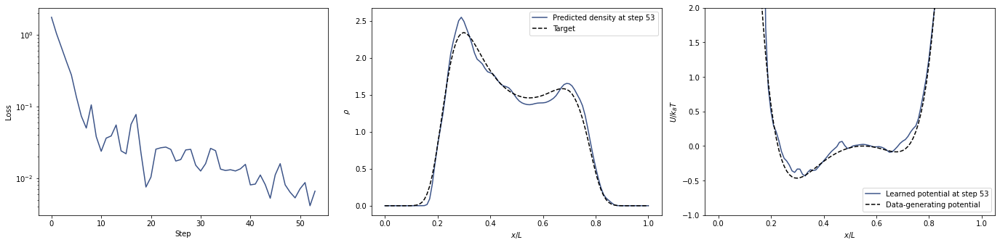

Step 54 in 39.45 sec loss =  0.004847067 



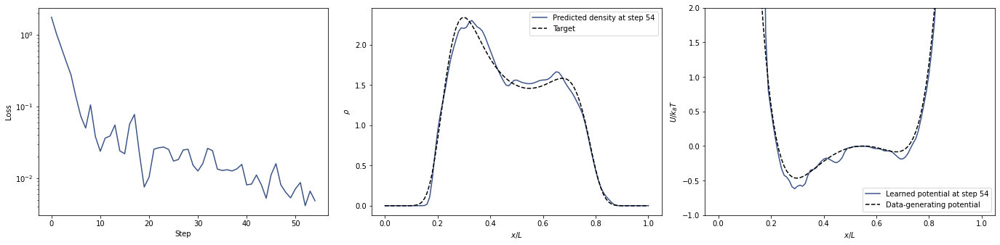

Step 55 in 38.45 sec loss =  0.0062785135 



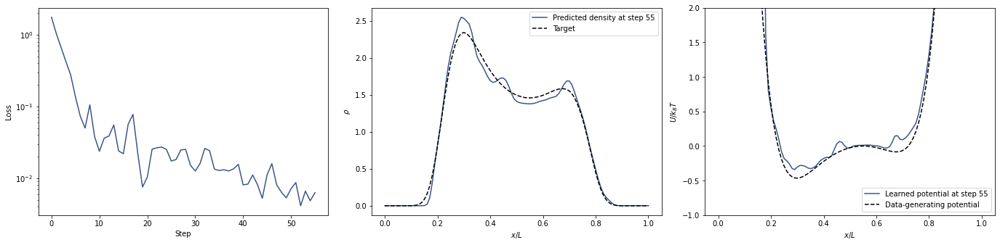

Step 56 in 39.26 sec loss =  0.0064966734 



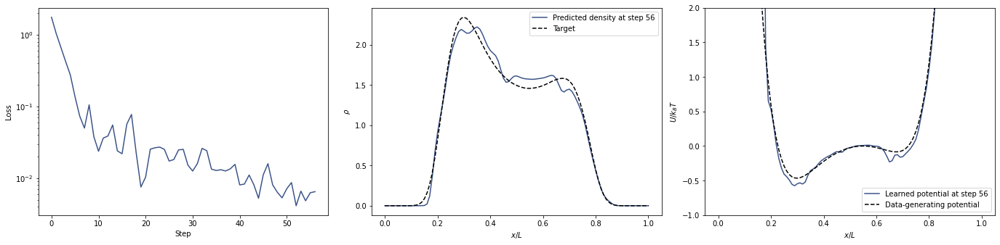

Step 57 in 39.61 sec loss =  0.0058964426 



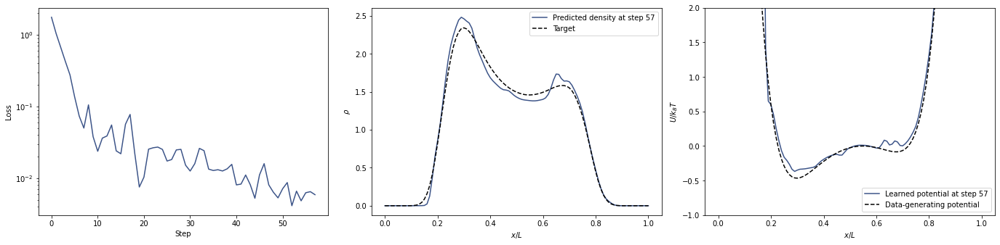

Step 58 in 39.27 sec loss =  0.006787908 



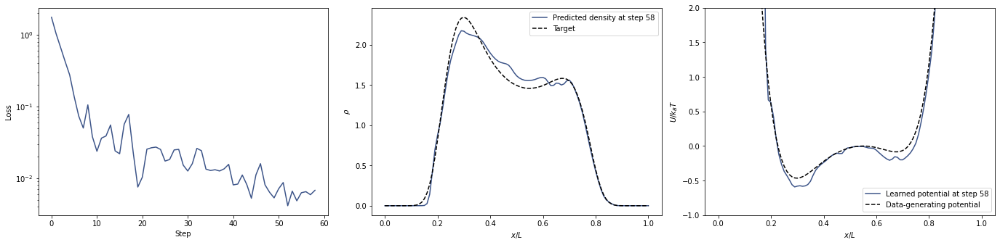

Step 59 in 39.67 sec loss =  0.0033598044 



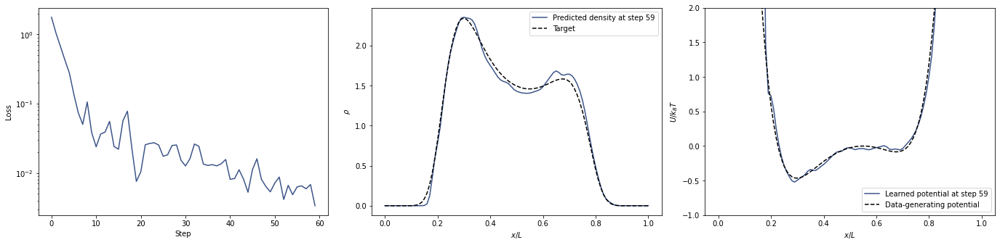

Step 60 in 39.28 sec loss =  0.002876094 



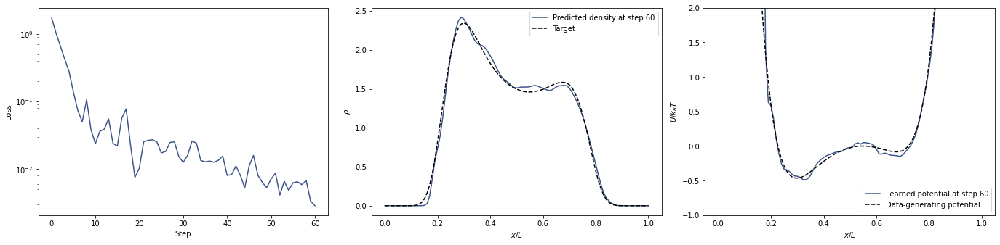

Step 61 in 39.63 sec loss =  0.0030857758 



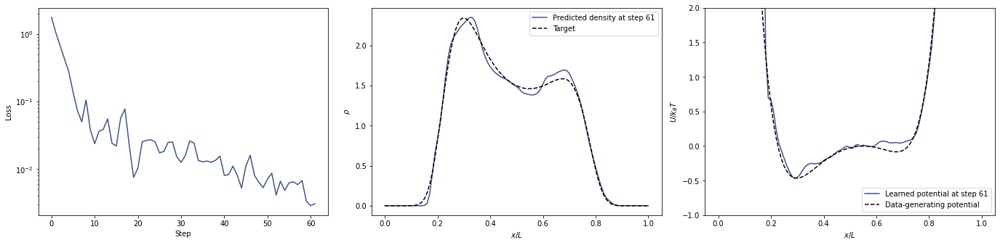

Step 62 in 39.53 sec loss =  0.004931505 



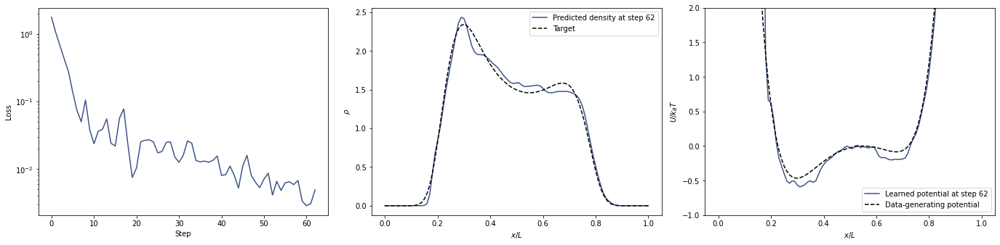

Step 63 in 39.68 sec loss =  0.0052633793 



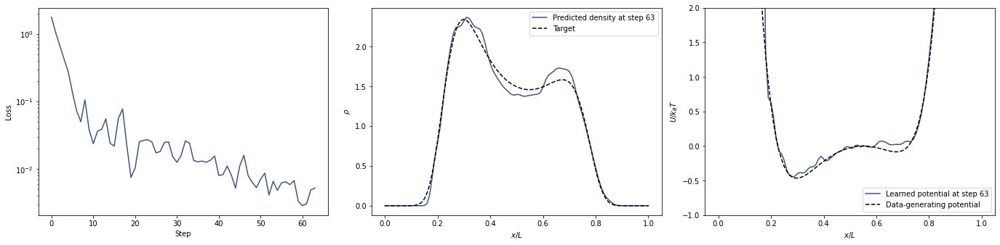

Step 64 in 39.36 sec loss =  0.0027986108 



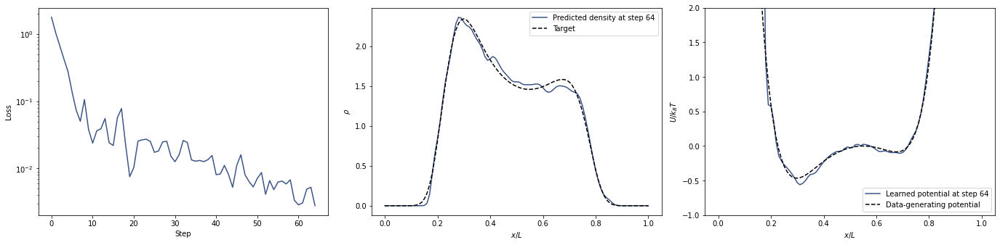

Step 65 in 39.43 sec loss =  0.0023189753 



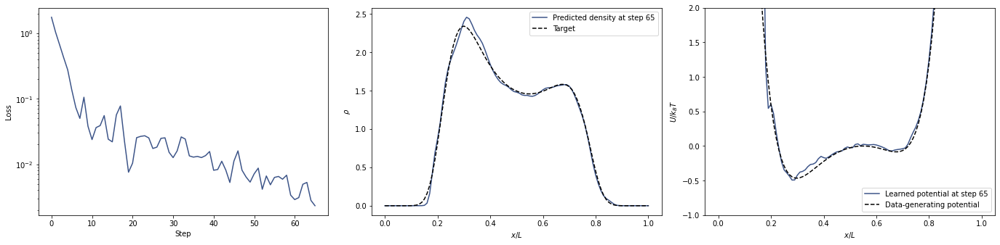

Step 66 in 38.94 sec loss =  0.002888545 



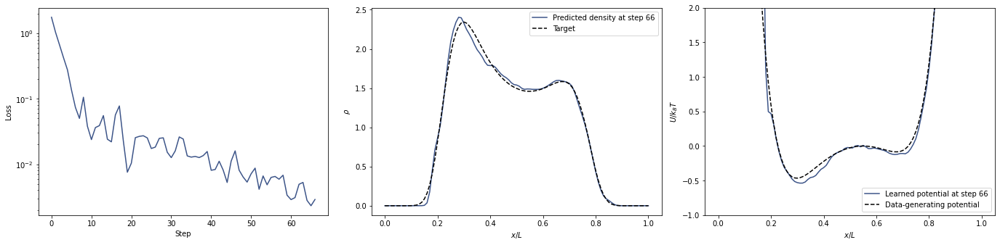

Step 67 in 39.10 sec loss =  0.0023090686 



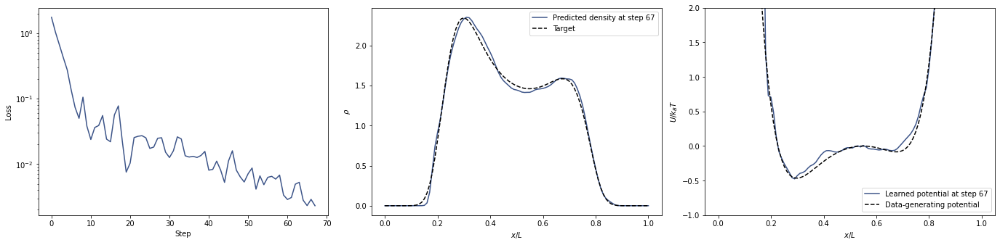

Step 68 in 39.36 sec loss =  0.003989806 



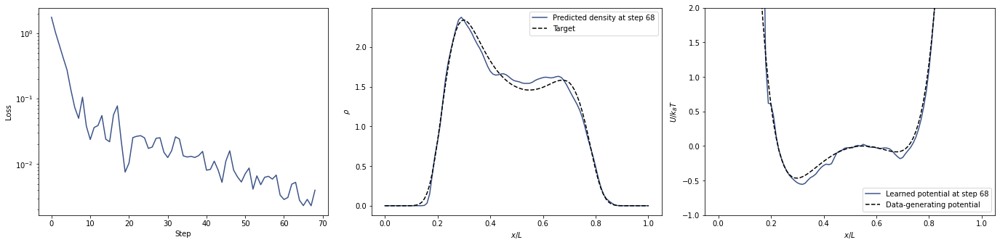

Step 69 in 38.88 sec loss =  0.003076404 



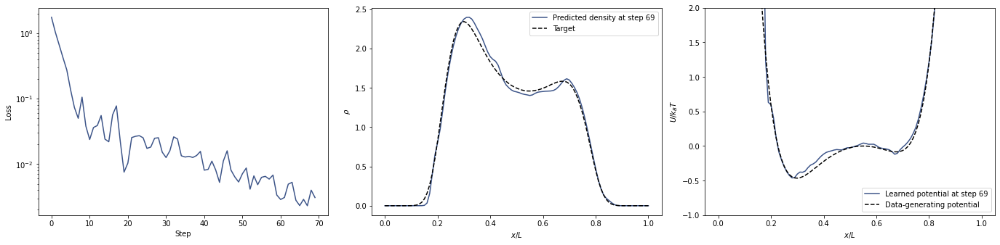

Step 70 in 39.52 sec loss =  0.0030386401 



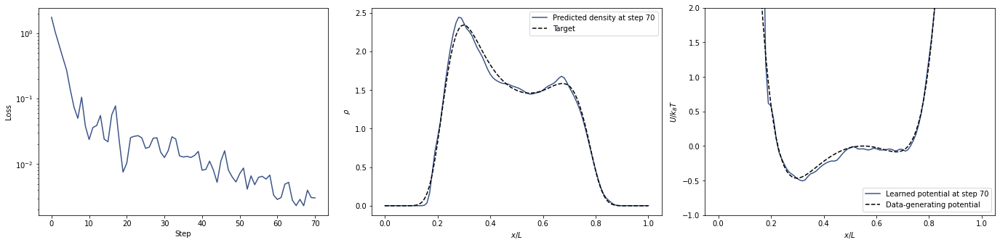

Step 71 in 39.64 sec loss =  0.002333631 



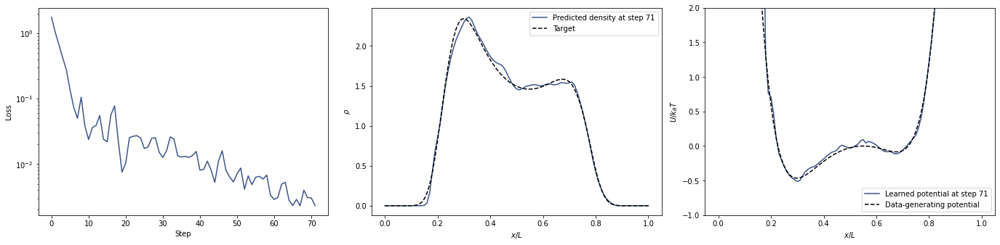

Step 72 in 39.73 sec loss =  0.0017365849 



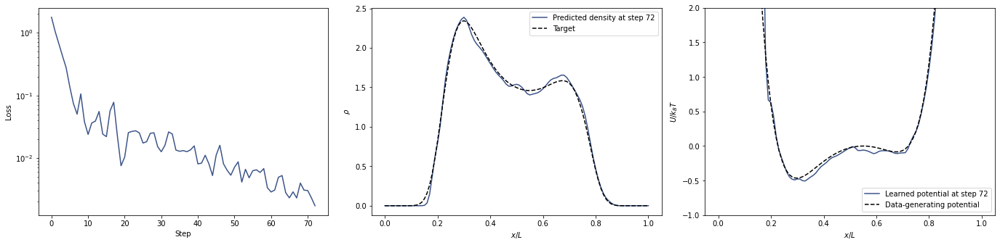

Step 73 in 39.38 sec loss =  0.0017073767 



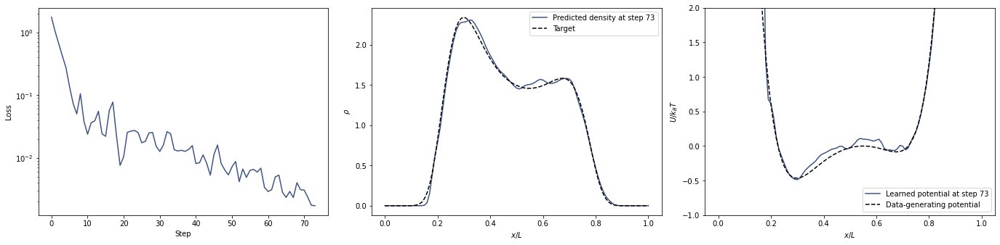

Step 74 in 39.36 sec loss =  0.0033488716 



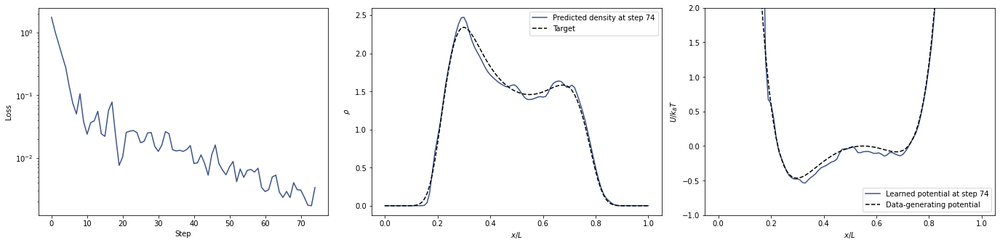

Step 75 in 38.78 sec loss =  0.0026056452 



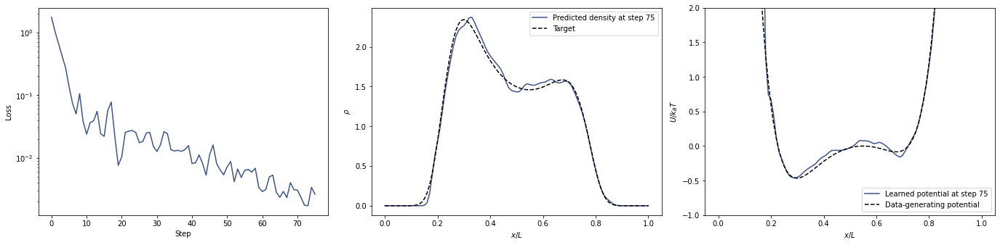

Step 76 in 39.17 sec loss =  0.004163113 



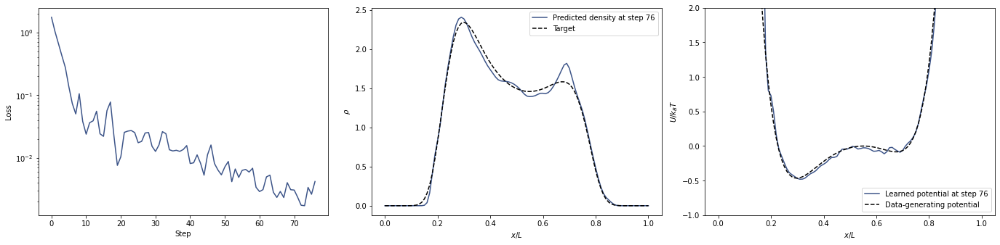

Step 77 in 39.38 sec loss =  0.0024773886 



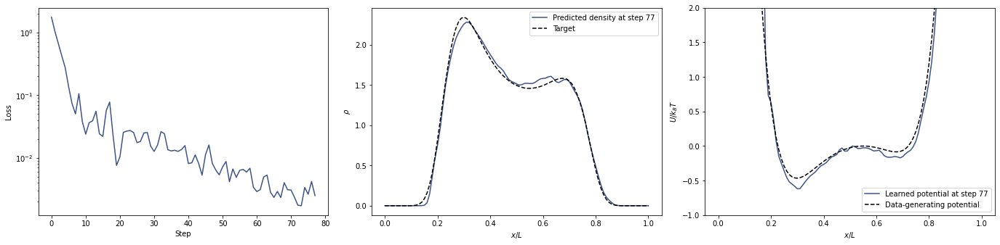

Step 78 in 39.04 sec loss =  0.0025312393 



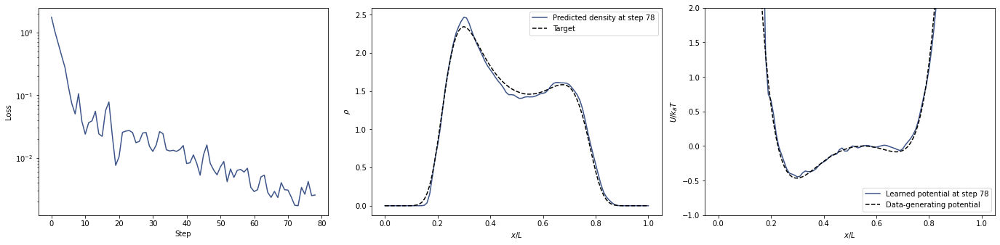

Step 79 in 39.23 sec loss =  0.001435195 



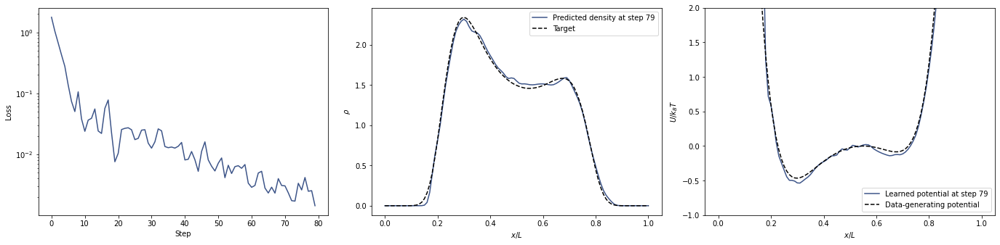

Step 80 in 39.45 sec loss =  0.0015625787 



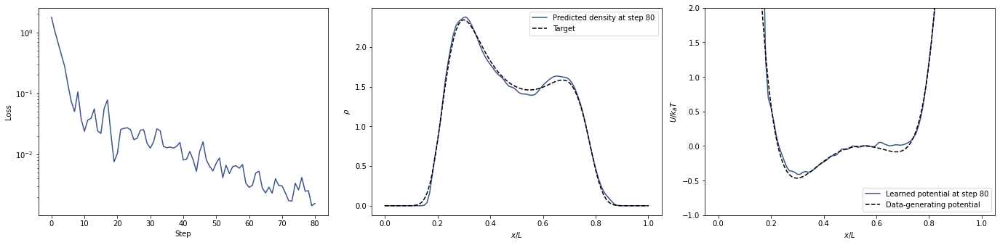

Step 81 in 39.12 sec loss =  0.0029018454 



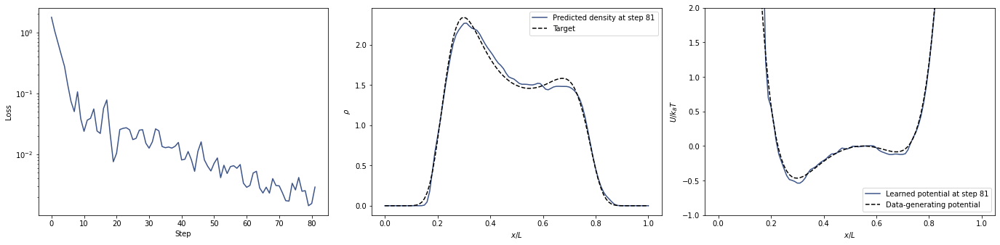

Step 82 in 39.41 sec loss =  0.002177416 



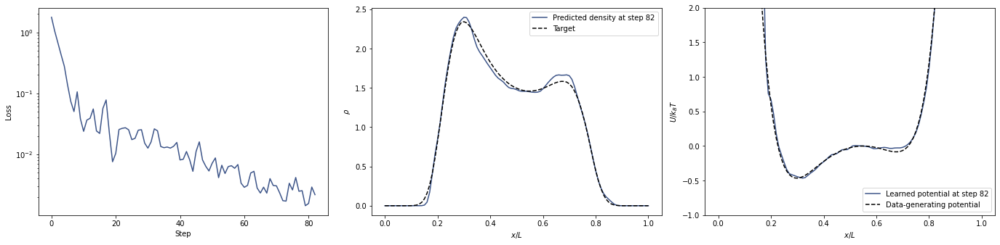

Step 83 in 39.45 sec loss =  0.0013681931 



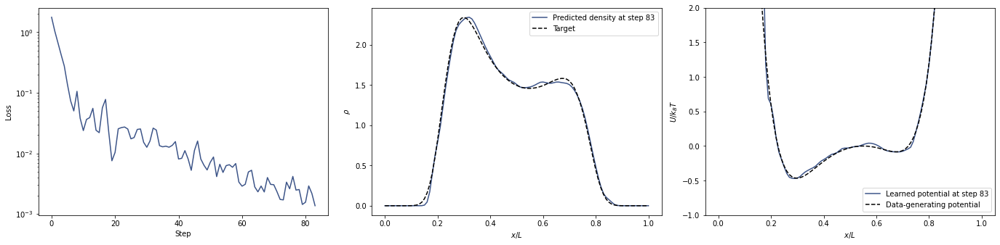

Step 84 in 39.27 sec loss =  0.0014542458 



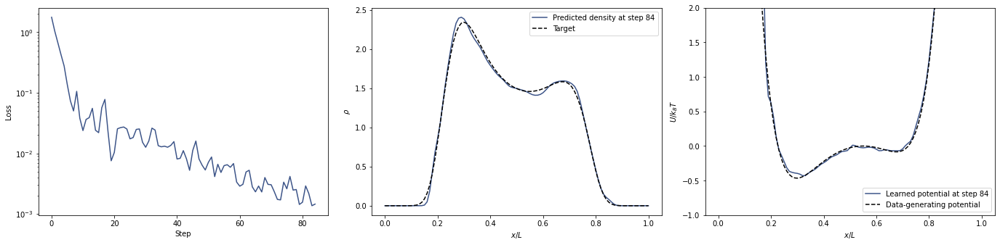

Step 85 in 39.08 sec loss =  0.0027347268 



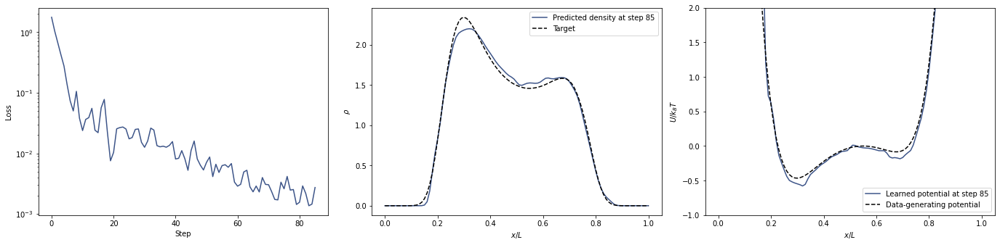

Step 86 in 39.26 sec loss =  0.0014332598 



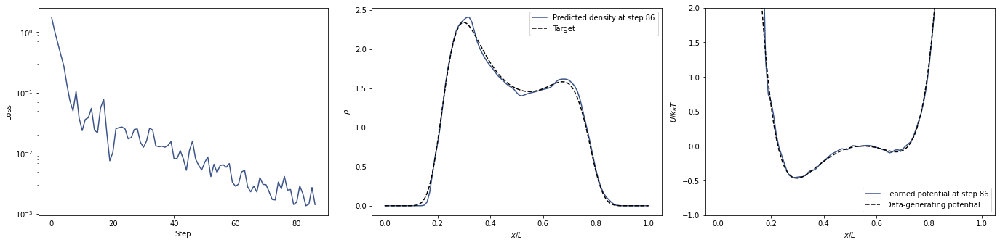

Step 87 in 39.07 sec loss =  0.00074339664 



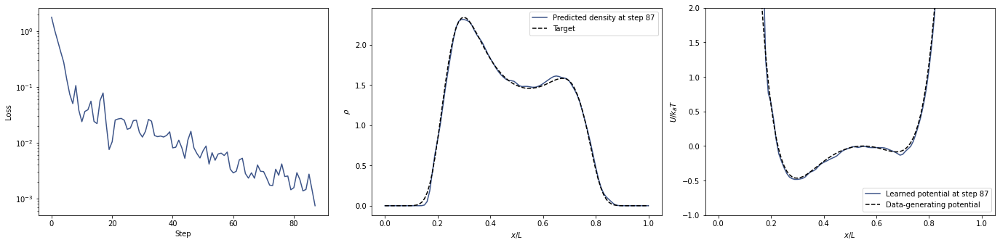

Step 88 in 39.42 sec loss =  0.0012125996 



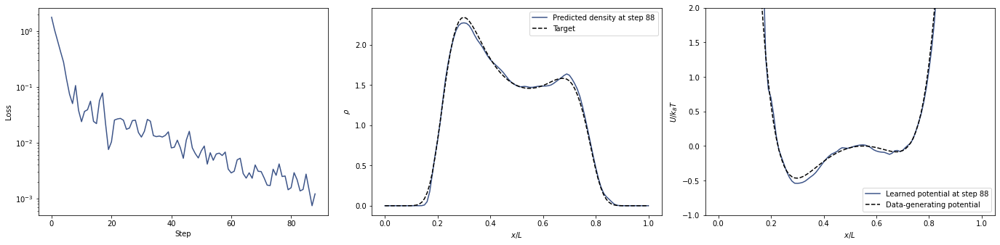

Step 89 in 39.29 sec loss =  0.002595301 



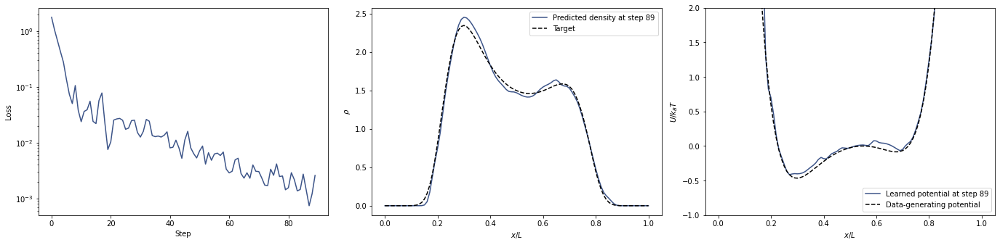

Step 90 in 38.94 sec loss =  0.0015708237 



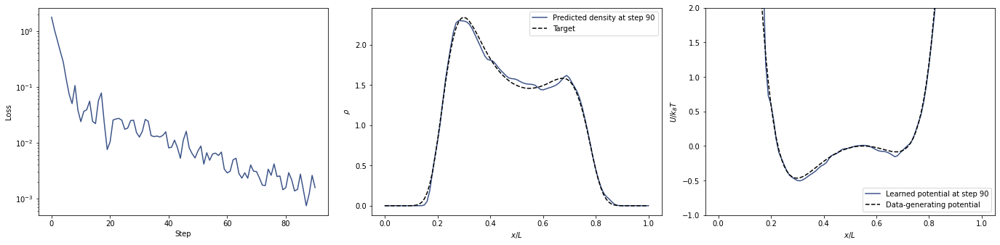

Step 91 in 39.43 sec loss =  0.00086803193 



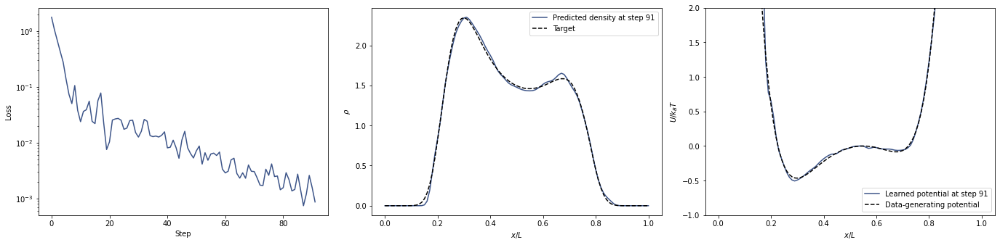

Step 92 in 39.58 sec loss =  0.00069052086 



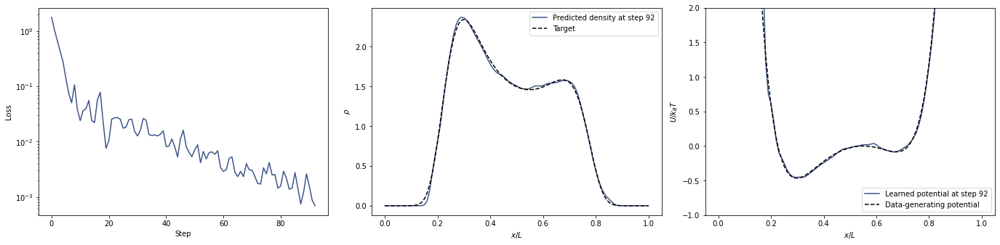

Step 93 in 39.42 sec loss =  0.0010250878 



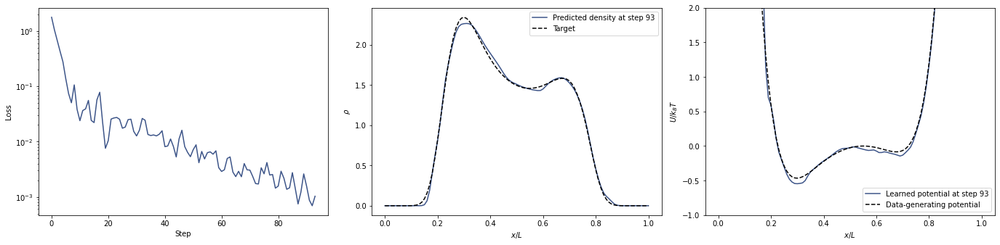

Step 94 in 39.30 sec loss =  0.0013849775 



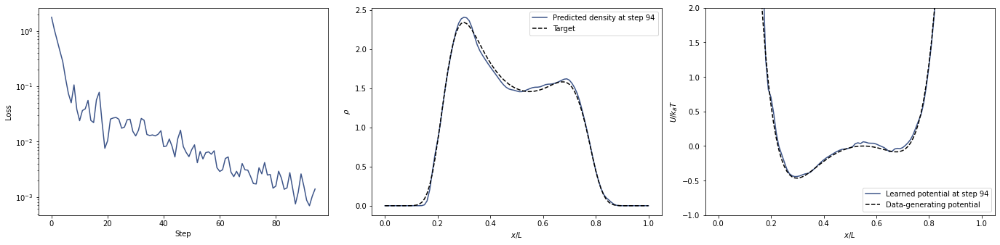

Step 95 in 39.73 sec loss =  0.0013523918 



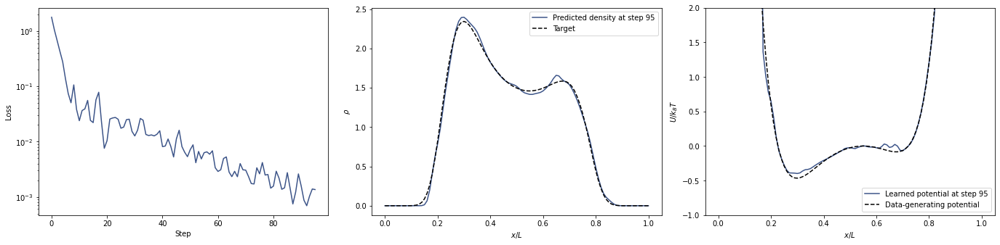

Step 96 in 39.12 sec loss =  0.0039341636 



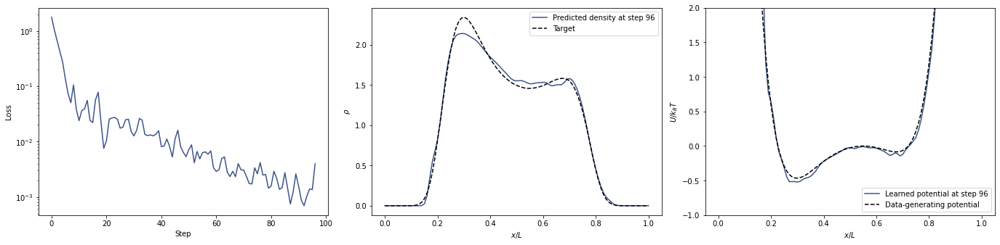

Step 97 in 39.65 sec loss =  0.00174537 



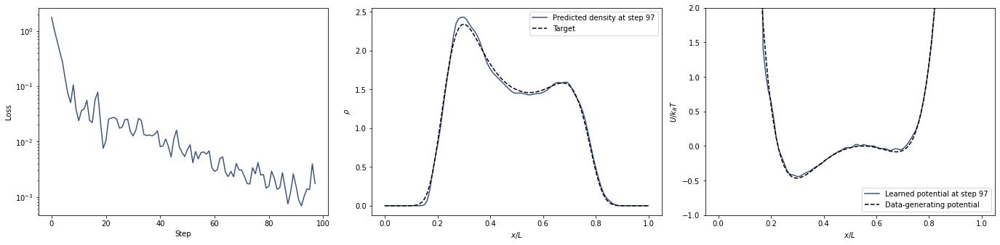

Step 98 in 39.23 sec loss =  0.0008179756 



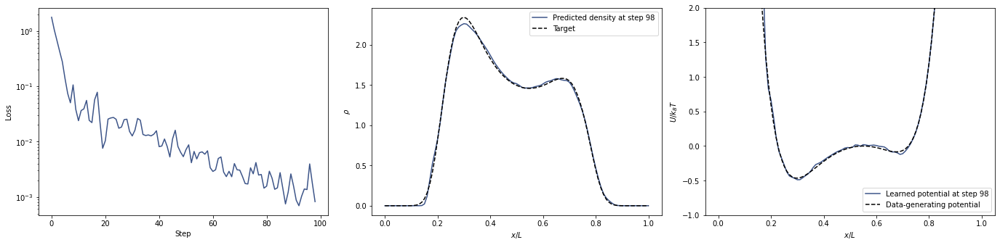

Step 99 in 38.76 sec loss =  0.0010552047 



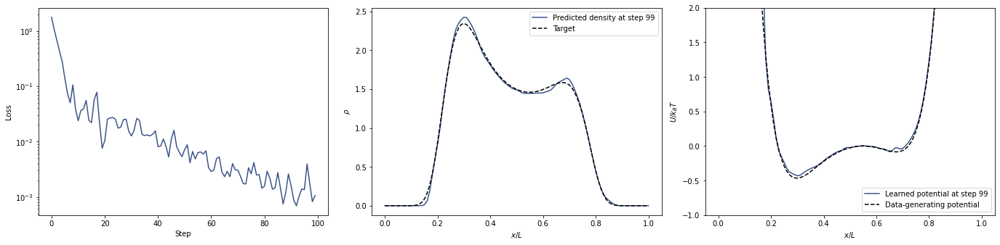

Step 100 in 38.73 sec loss =  0.00083194656 



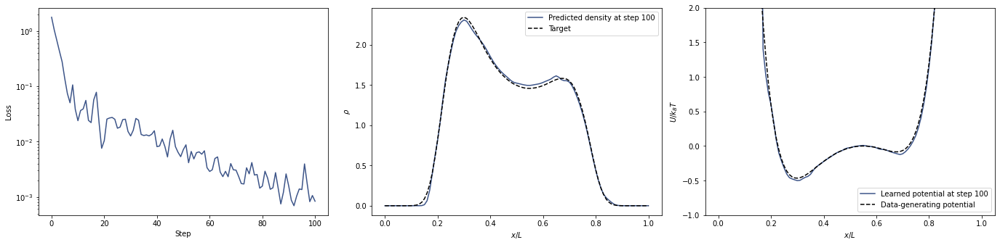

Step 101 in 39.54 sec loss =  0.00083360745 



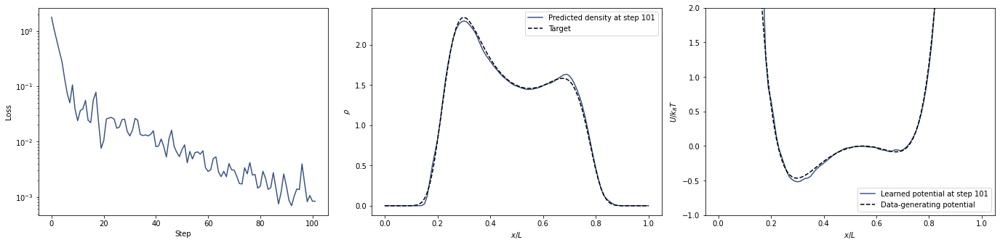

Step 102 in 39.12 sec loss =  0.0007810671 



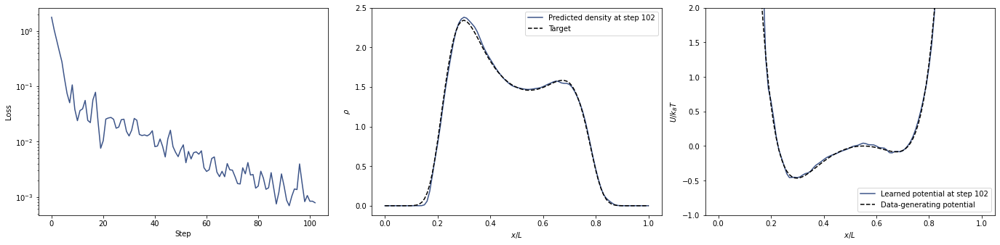

Step 103 in 39.75 sec loss =  0.0010808618 



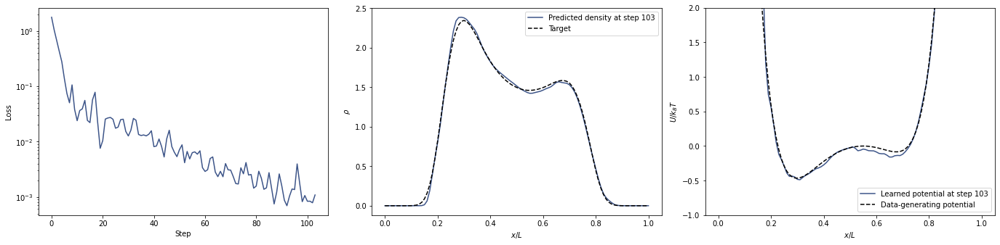

Step 104 in 39.57 sec loss =  0.0015930994 



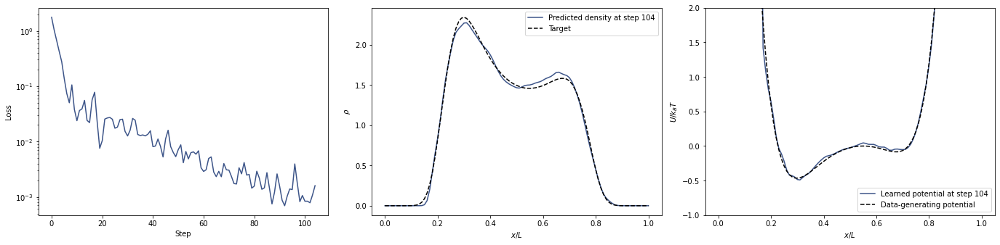

Step 105 in 39.19 sec loss =  0.00092779985 



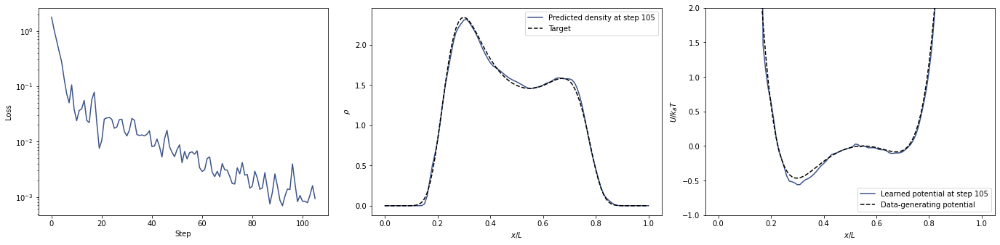

Step 106 in 39.17 sec loss =  0.0012398158 



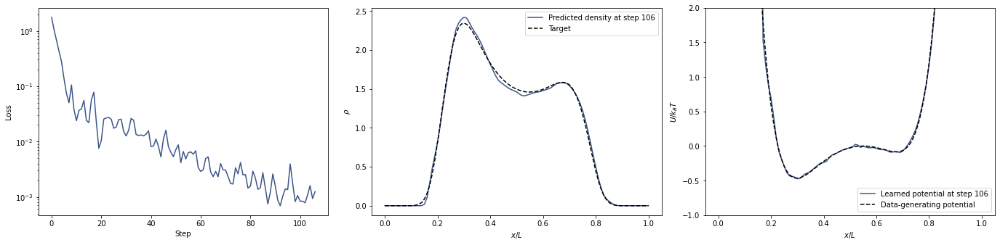

Step 107 in 39.38 sec loss =  0.00050801865 



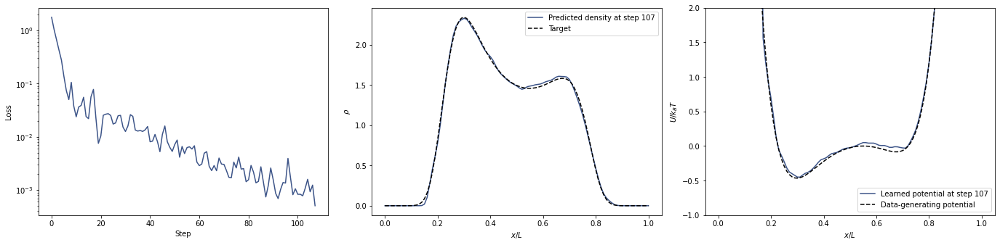

Step 108 in 39.26 sec loss =  0.00067223224 



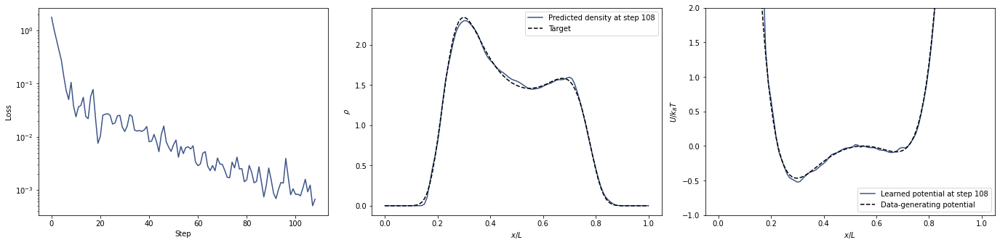

Step 109 in 38.87 sec loss =  0.0008381434 



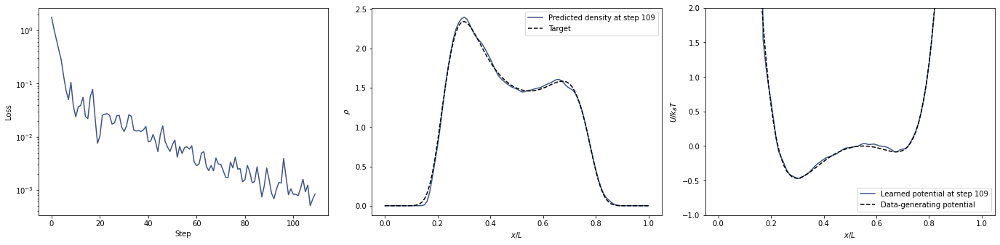

Step 110 in 38.96 sec loss =  0.0004756451 



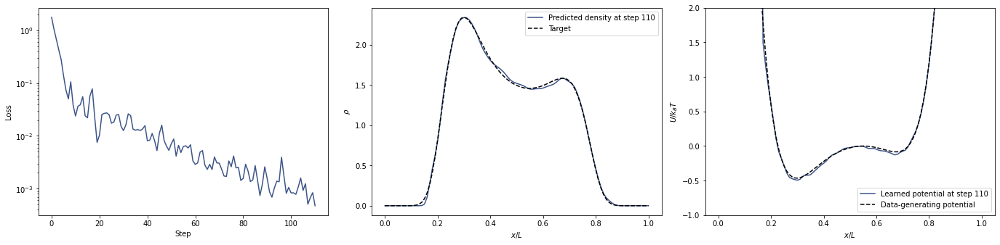

Step 111 in 39.22 sec loss =  0.0006770223 



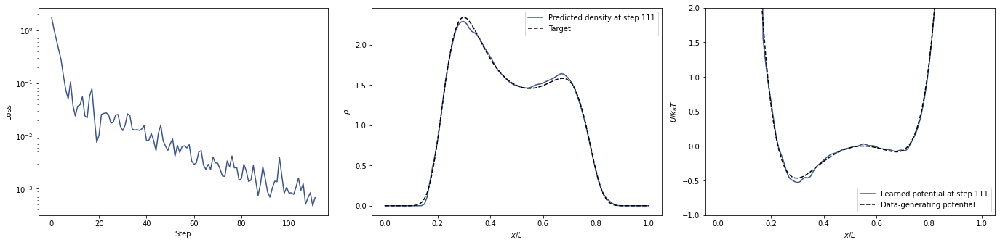

Step 112 in 39.65 sec loss =  0.00097119546 



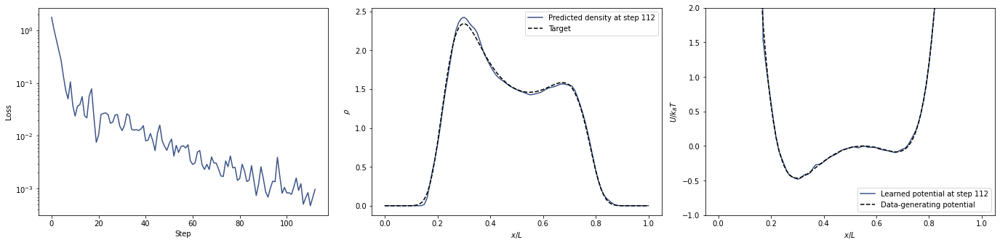

Step 113 in 39.46 sec loss =  0.00044897827 



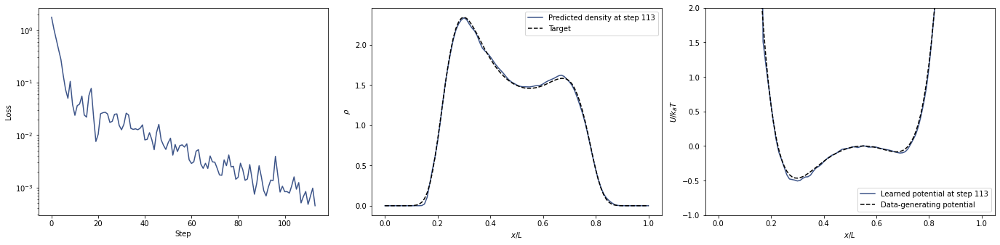

Step 114 in 39.09 sec loss =  0.0006518062 



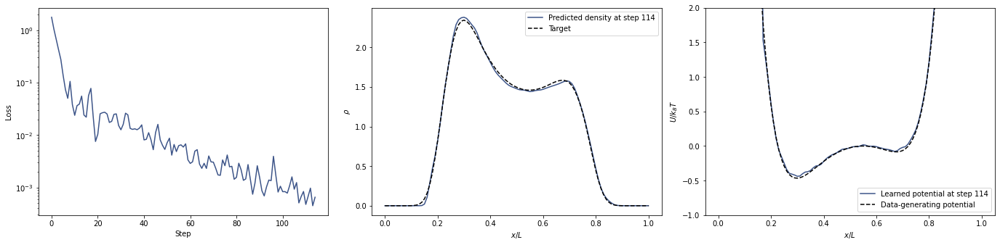

Step 115 in 39.40 sec loss =  0.0008028043 



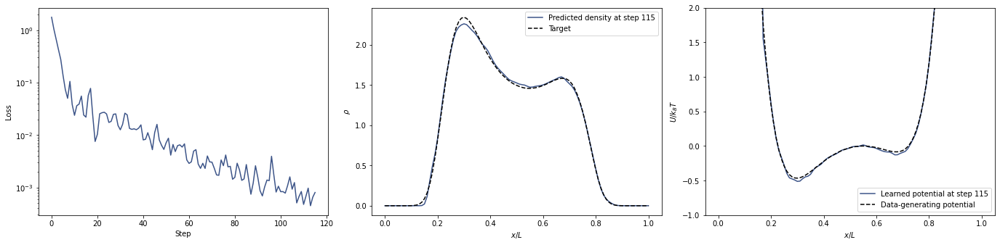

Step 116 in 38.92 sec loss =  0.00073595316 



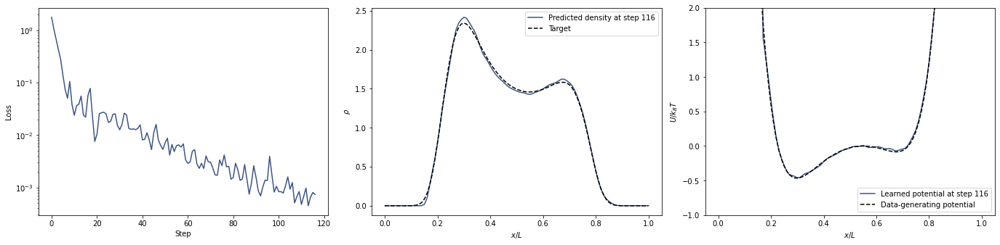

Step 117 in 39.43 sec loss =  0.00041742885 



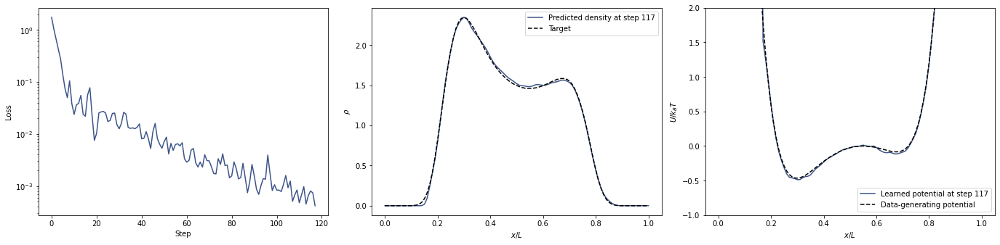

Step 118 in 39.34 sec loss =  0.0003078997 



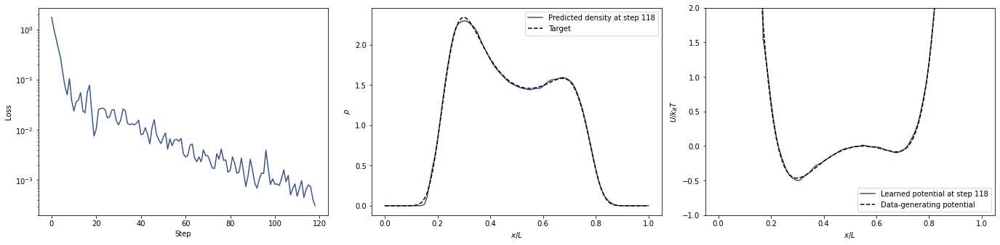

Step 119 in 39.79 sec loss =  0.00085040857 



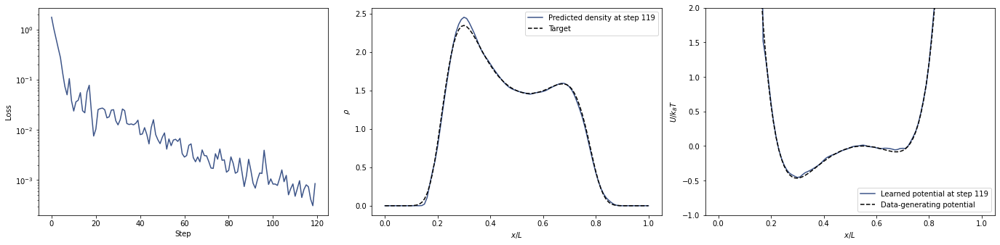

Step 120 in 39.50 sec loss =  0.00036411235 



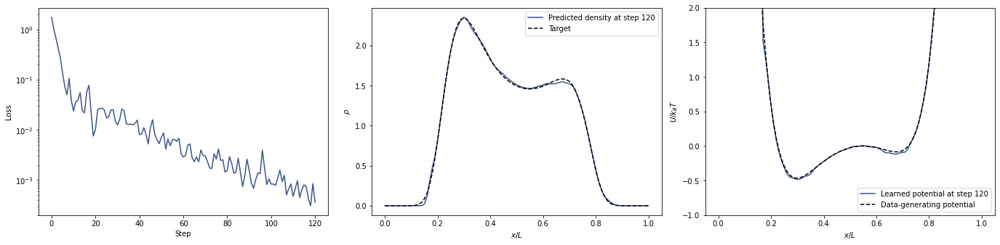

Step 121 in 39.27 sec loss =  0.00048785057 



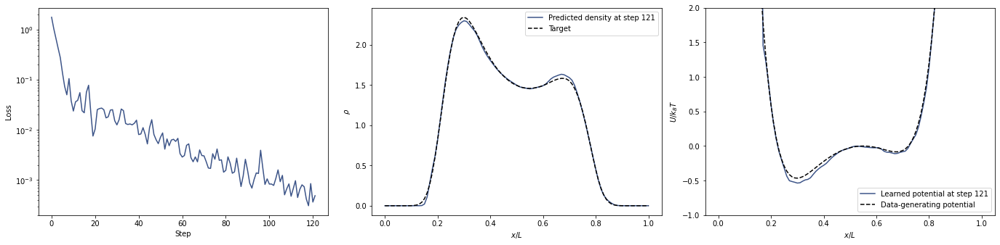

Step 122 in 38.72 sec loss =  0.0020761013 



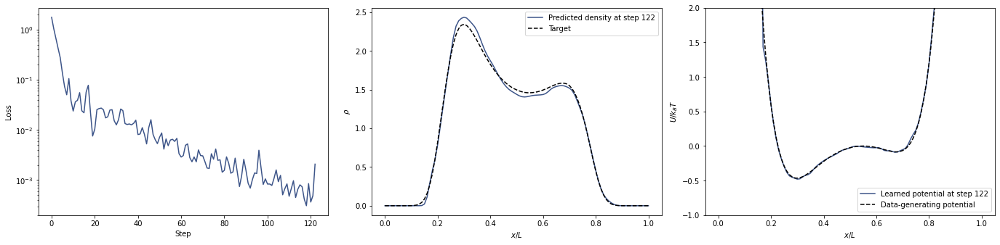

Step 123 in 39.20 sec loss =  0.0010268312 



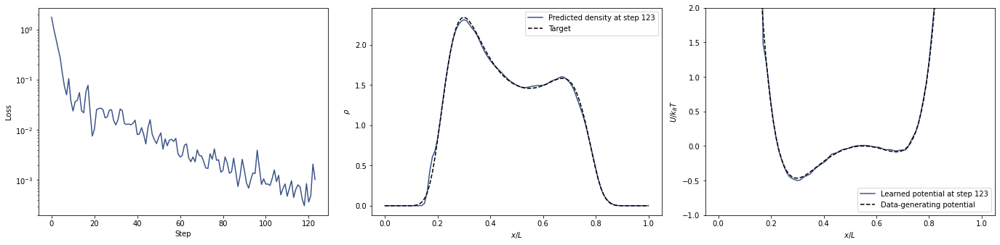

Step 124 in 38.88 sec loss =  0.0014909004 



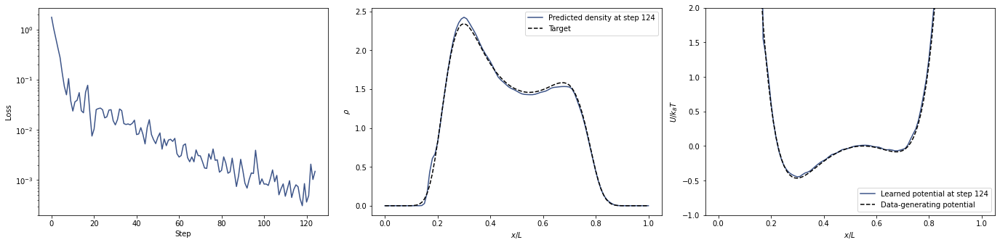

Step 125 in 39.21 sec loss =  0.0011887875 



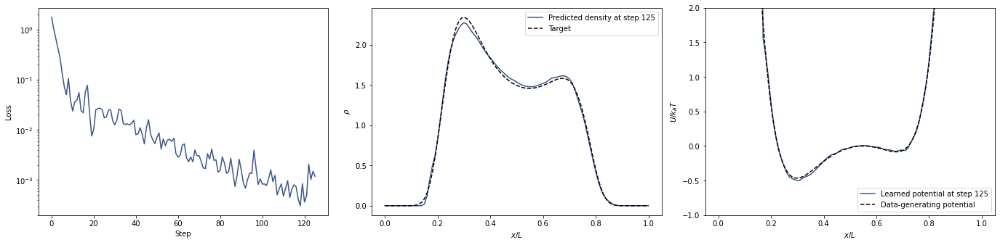

Step 126 in 39.43 sec loss =  0.0006910001 



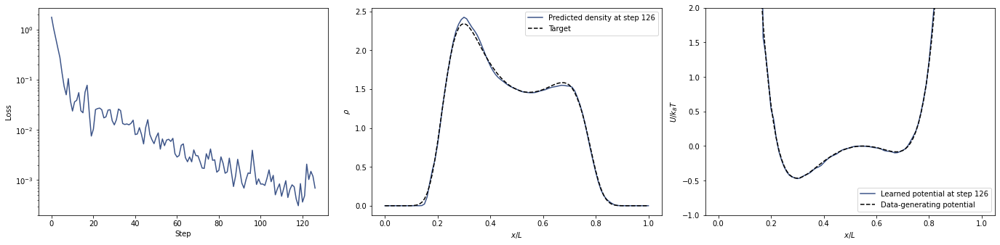

Step 127 in 38.84 sec loss =  0.0010941388 



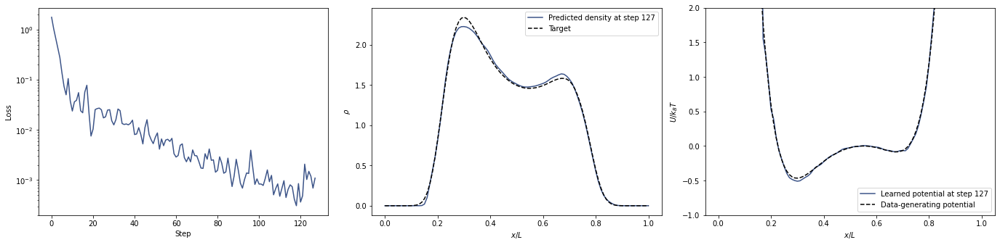

Step 128 in 39.32 sec loss =  0.00022051773 



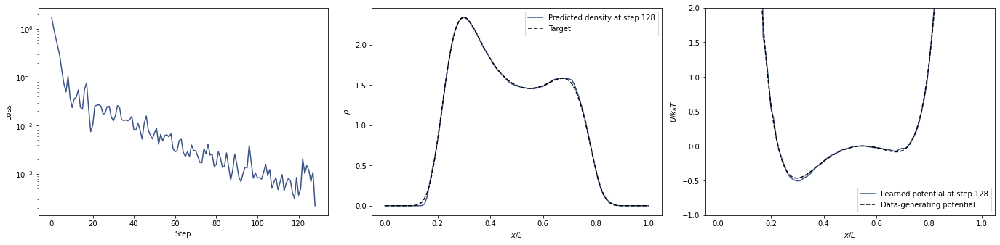

Step 129 in 39.61 sec loss =  0.0003720259 



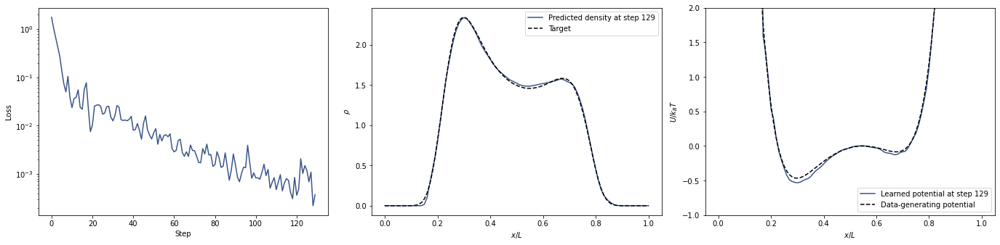

Step 130 in 39.56 sec loss =  0.0013506569 



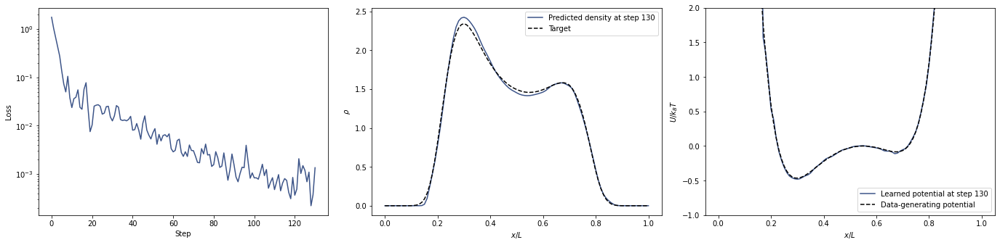

Step 131 in 39.78 sec loss =  0.00033087793 



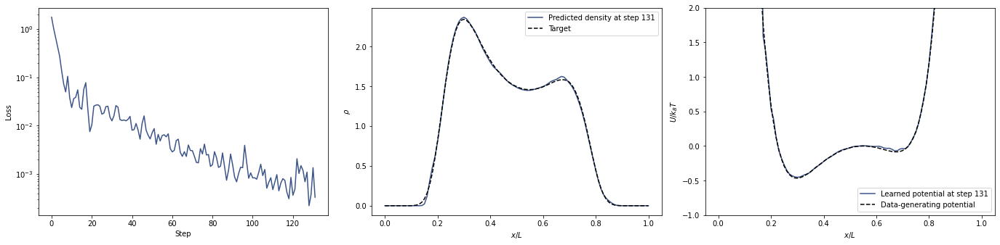

Step 132 in 39.56 sec loss =  0.00033954566 



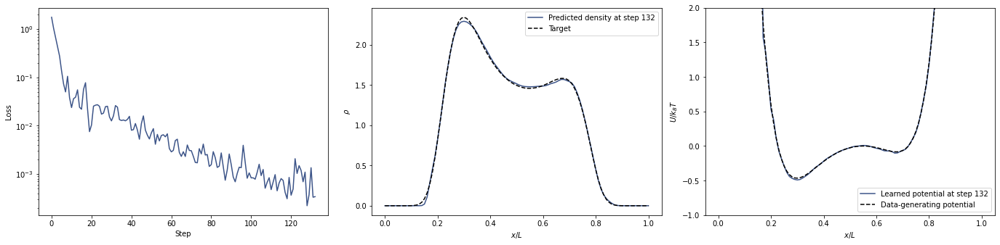

Step 133 in 39.12 sec loss =  0.00021722667 



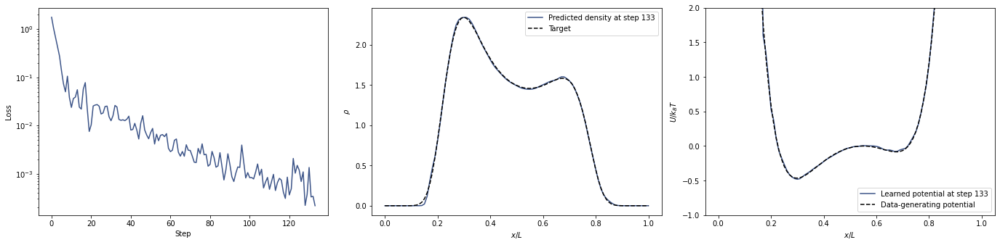

Step 134 in 39.44 sec loss =  0.00025004614 



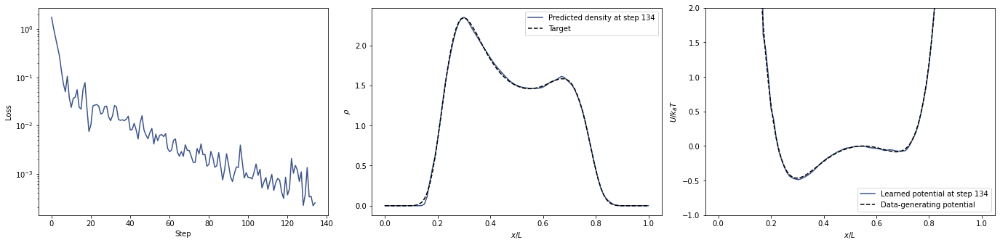

Step 135 in 38.64 sec loss =  0.00025220597 



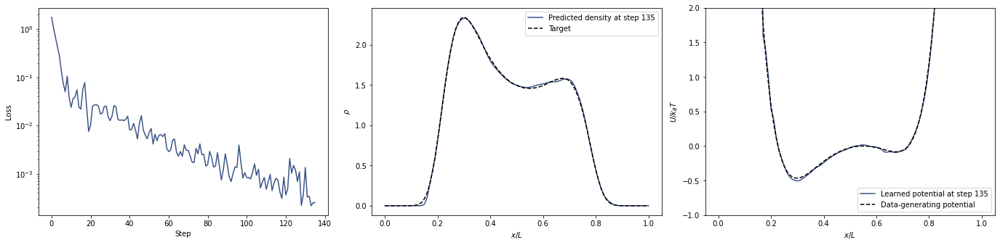

Step 136 in 38.97 sec loss =  0.00043829647 



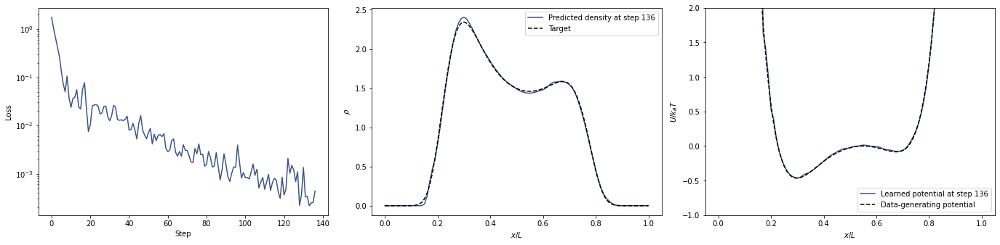

Step 137 in 39.15 sec loss =  0.00065632997 



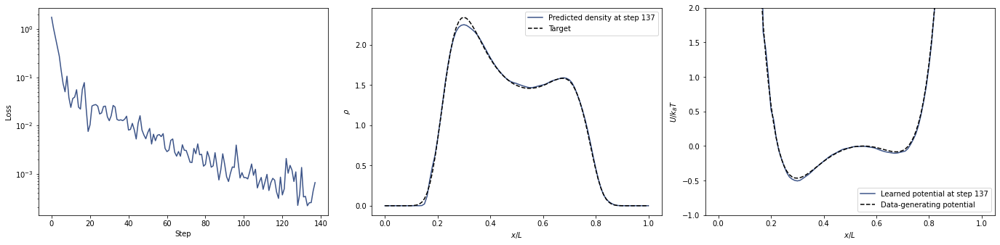

Step 138 in 39.18 sec loss =  0.00042259257 



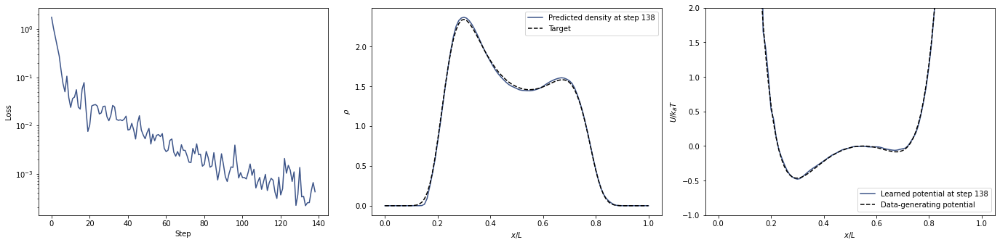

Step 139 in 39.28 sec loss =  0.00030564007 



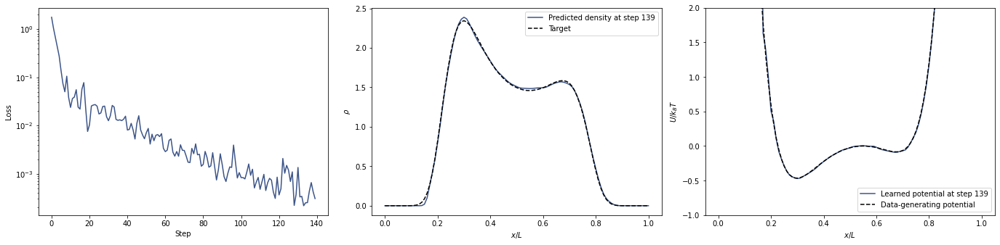

Step 140 in 39.23 sec loss =  0.00021749816 



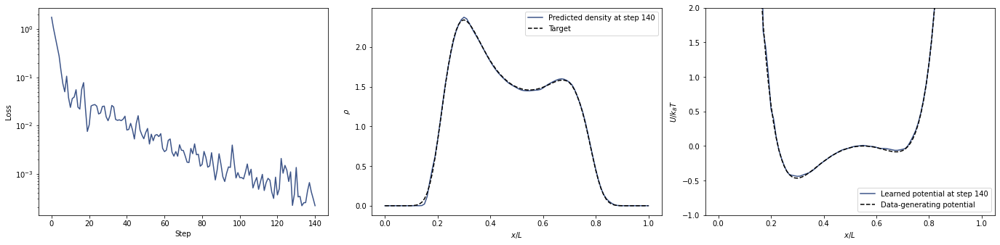

Step 141 in 39.14 sec loss =  0.0006219373 



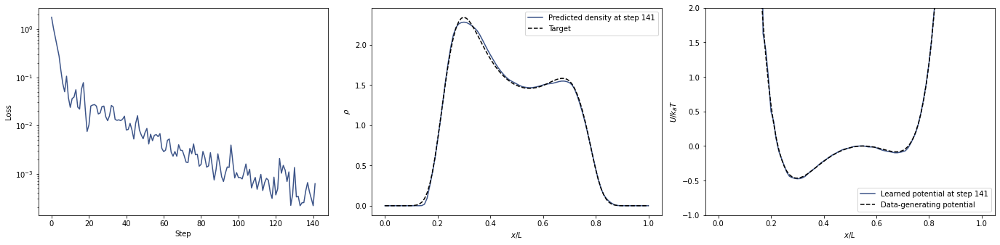

Step 142 in 39.13 sec loss =  0.0007074392 



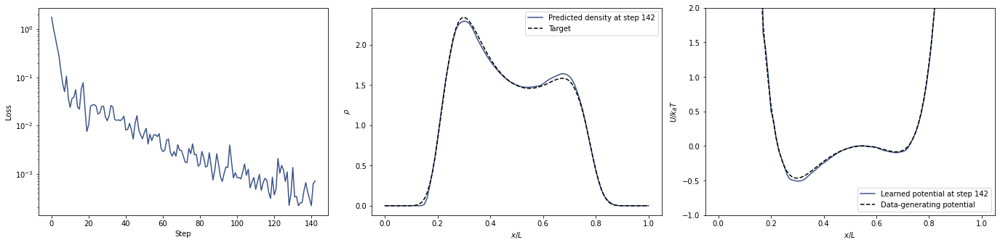

Step 143 in 38.63 sec loss =  0.00027493408 



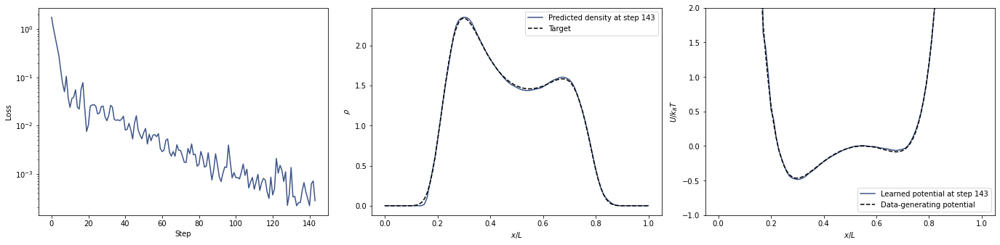

Step 144 in 38.93 sec loss =  0.0003587779 



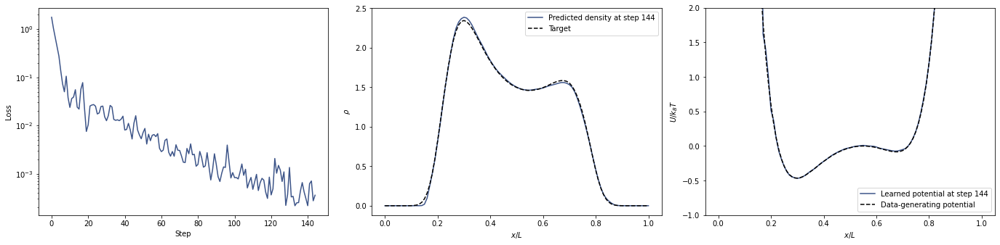

Step 145 in 39.29 sec loss =  0.00056016556 



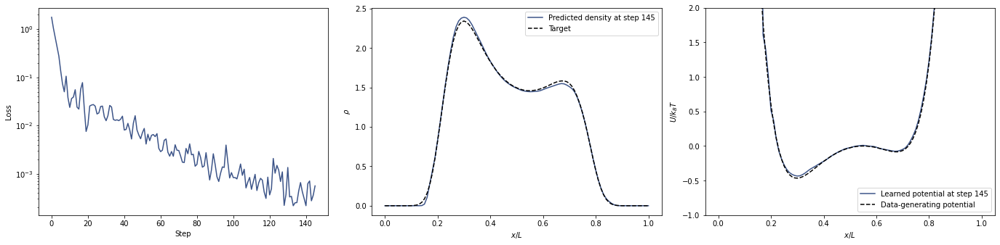

Step 146 in 39.11 sec loss =  0.001384301 



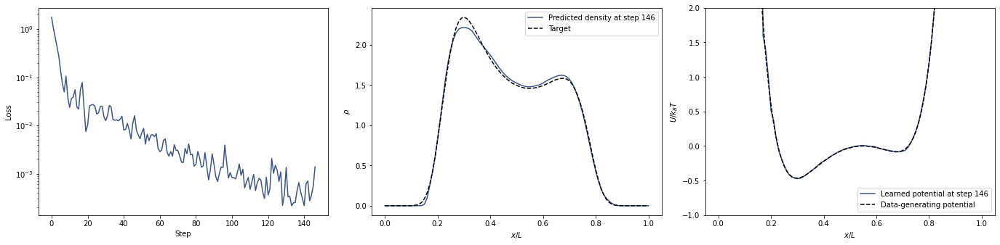

Step 147 in 38.95 sec loss =  0.0002789716 



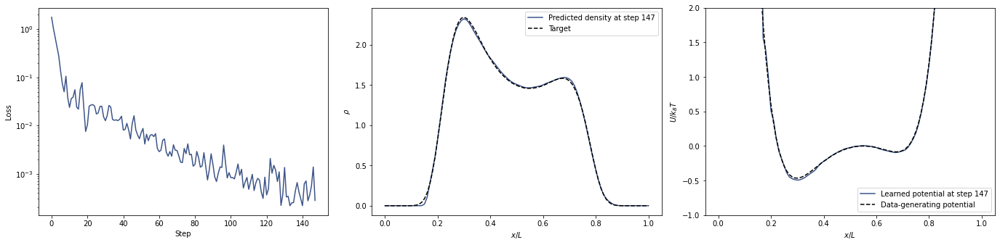

Step 148 in 39.59 sec loss =  0.0003821647 



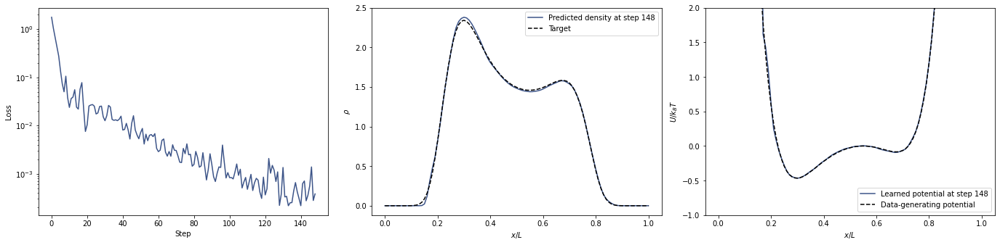

Step 149 in 39.93 sec loss =  0.00022531241 



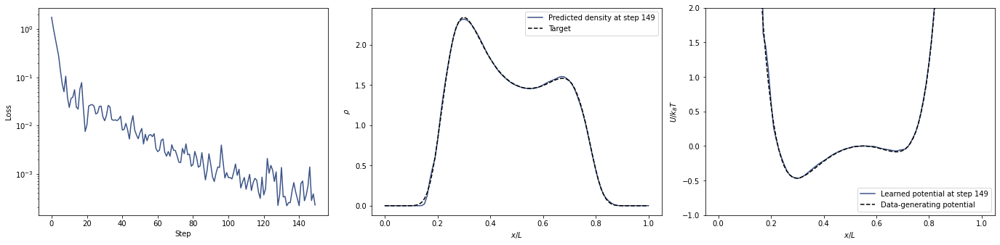

Step 150 in 3.05 sec loss =  0.00016967408 



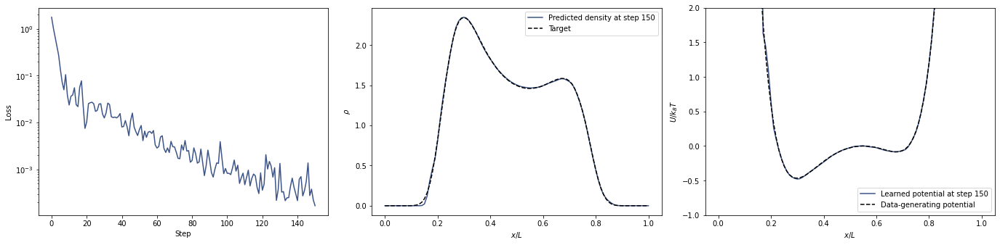

Step 151 in 2.92 sec loss =  0.0001606741 



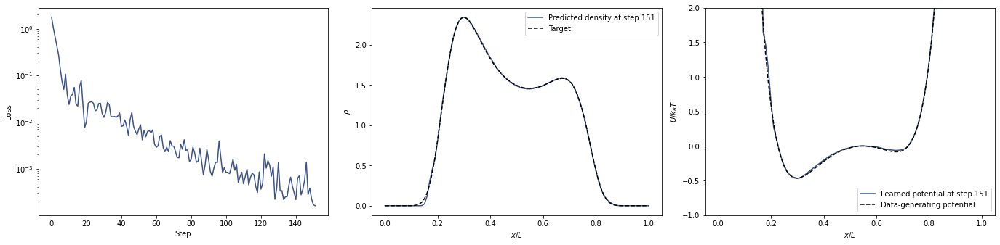

Step 152 in 38.79 sec loss =  0.00044150057 



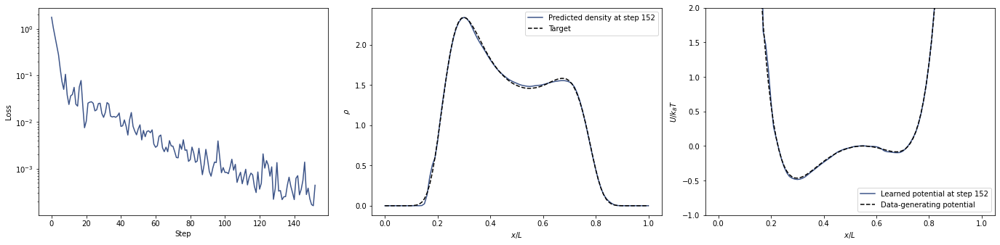

Step 153 in 39.05 sec loss =  0.00031551183 



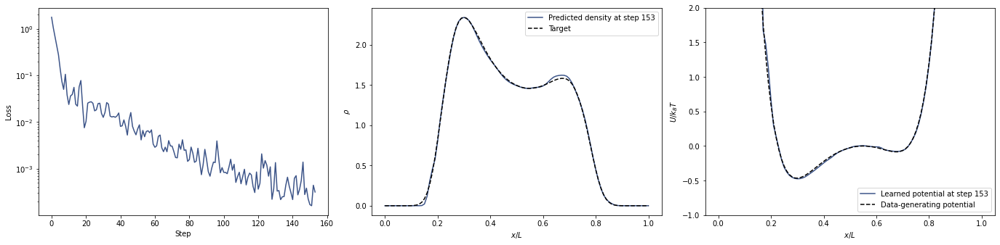

Step 154 in 38.26 sec loss =  0.00031894885 



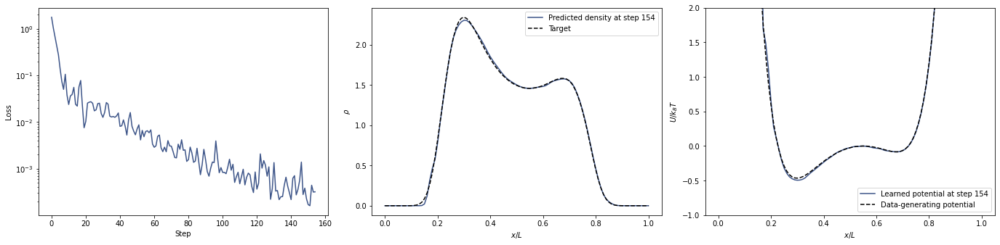

Step 155 in 38.84 sec loss =  0.00095110585 



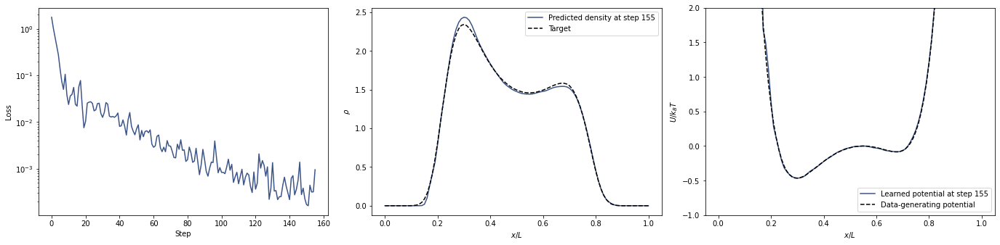

Step 156 in 38.85 sec loss =  0.00028198314 



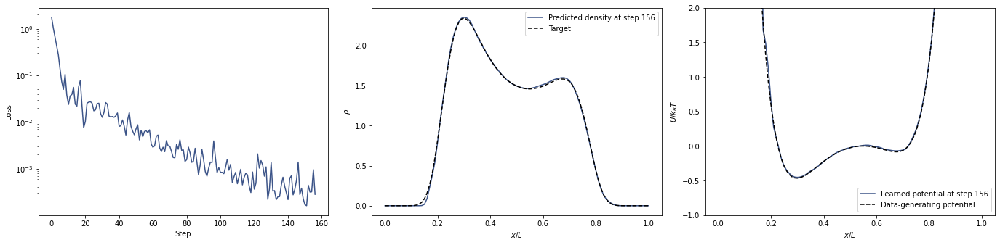

Step 157 in 2.31 sec loss =  0.00020439322 



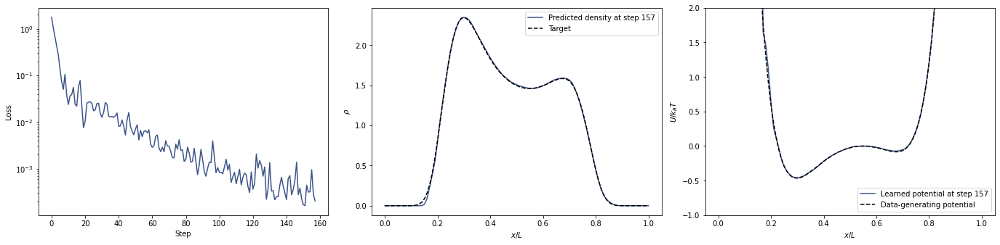

Step 158 in 2.46 sec loss =  0.0001704535 



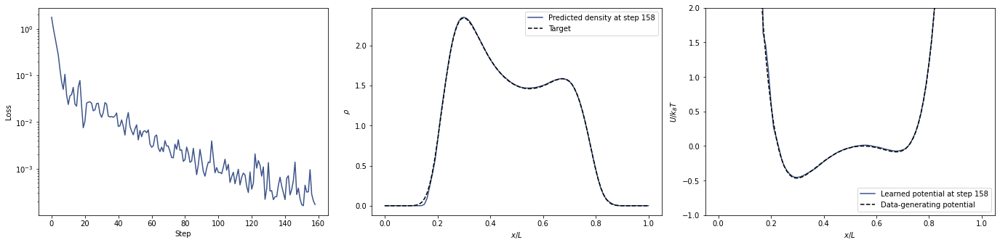

Step 159 in 38.53 sec loss =  0.00030493128 



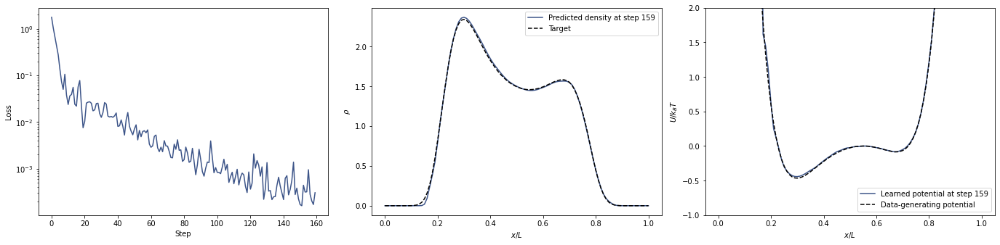

Step 160 in 38.60 sec loss =  0.00033802597 



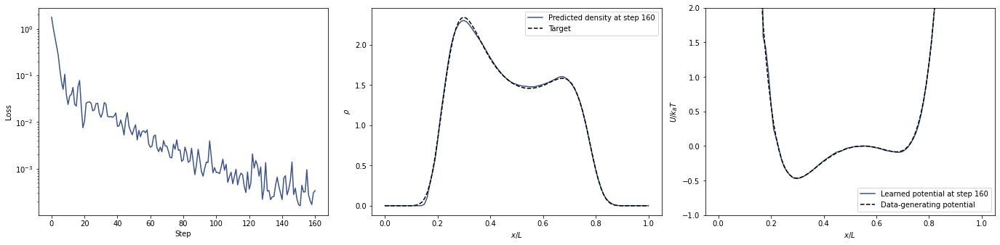

Step 161 in 39.58 sec loss =  0.0005040799 



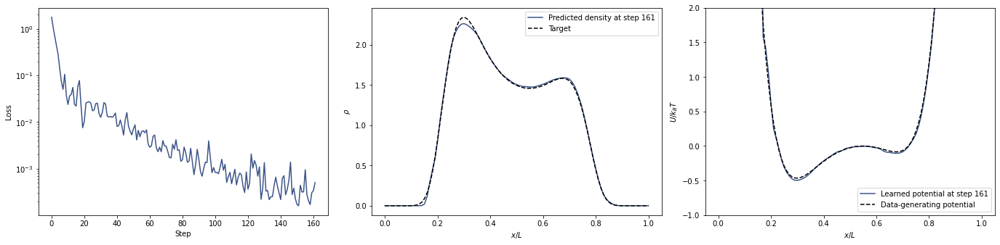

Step 162 in 3.03 sec loss =  0.00030554415 



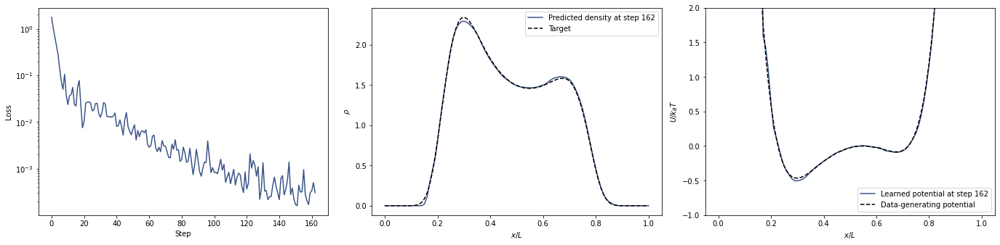

Step 163 in 39.69 sec loss =  0.0014316941 



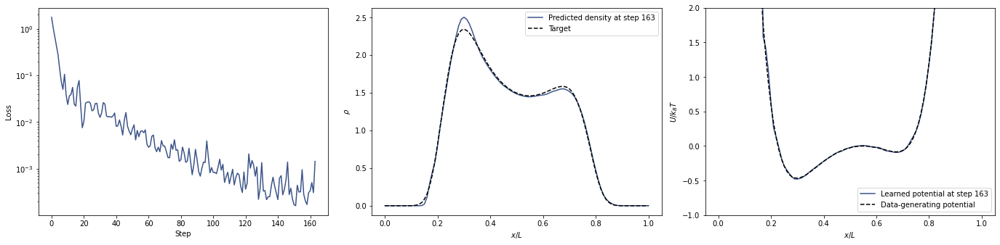

Step 164 in 39.77 sec loss =  0.0006239857 



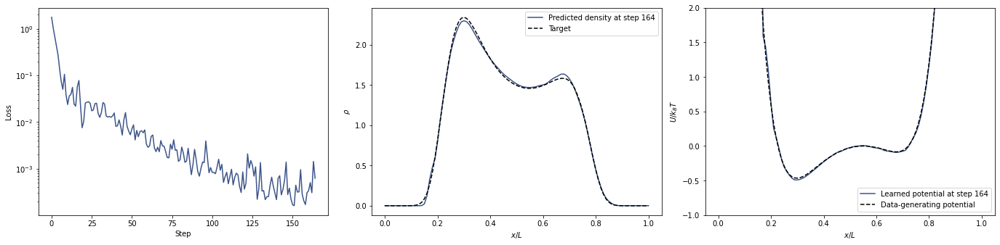

Step 165 in 2.93 sec loss =  0.00036133218 



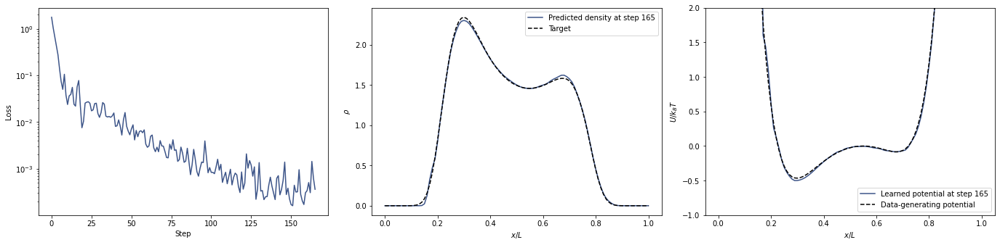

Step 166 in 39.25 sec loss =  0.00032149235 



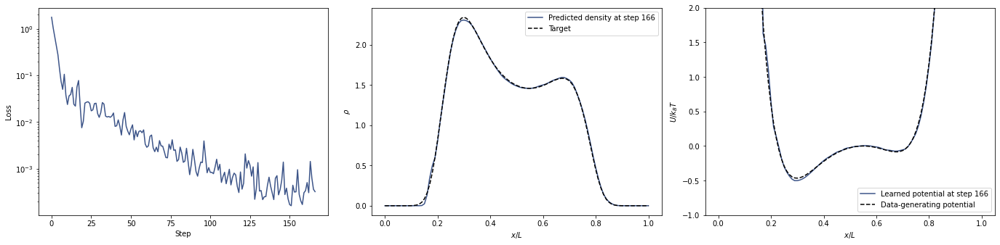

Step 167 in 2.03 sec loss =  0.0002726605 



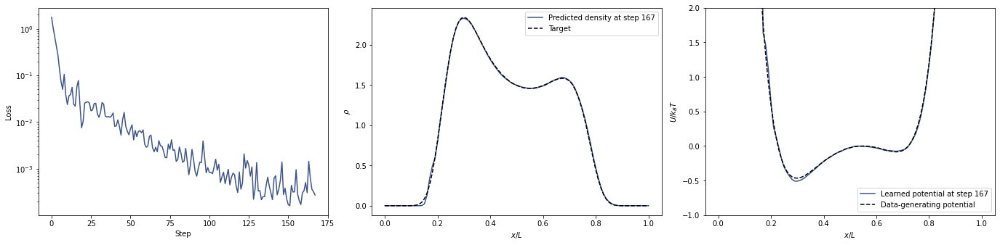

Step 168 in 2.29 sec loss =  0.00025191475 



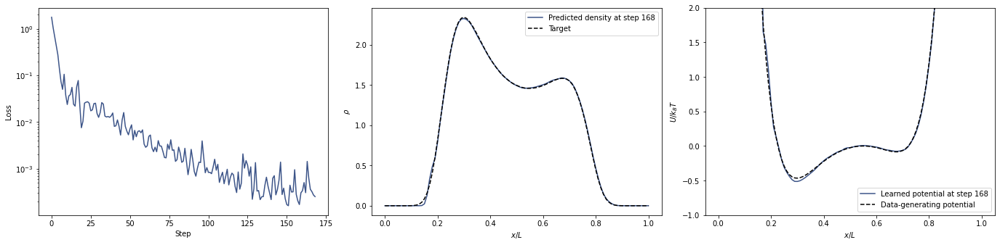

Step 169 in 2.02 sec loss =  0.0002614755 



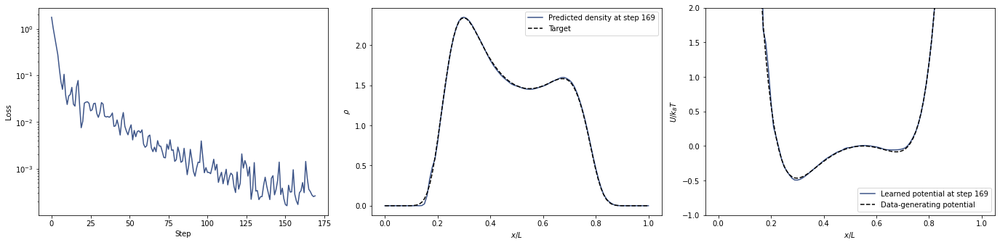

Step 170 in 38.50 sec loss =  0.00026763103 



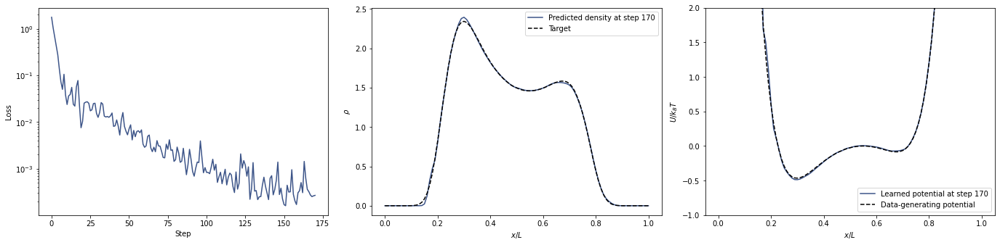

Step 171 in 2.95 sec loss =  0.00018010351 



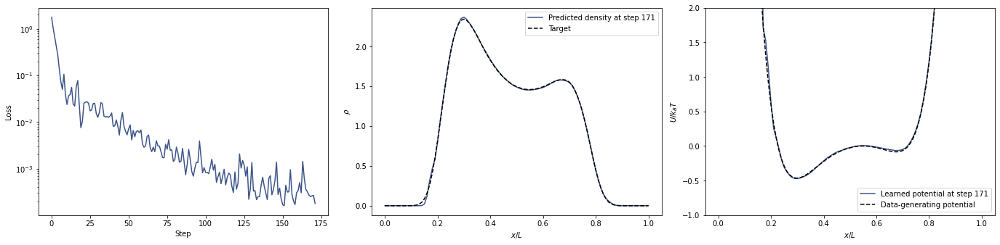

Step 172 in 2.91 sec loss =  0.0001630361 



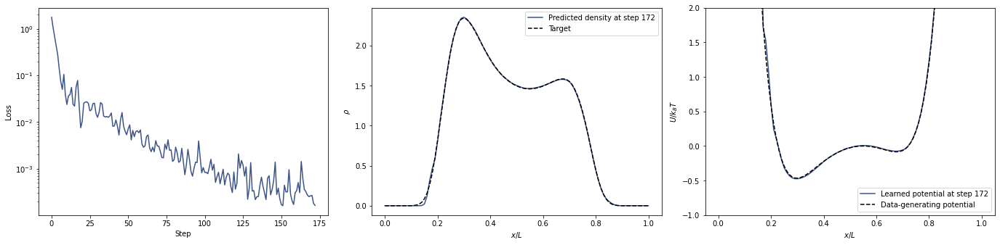

Step 173 in 39.08 sec loss =  0.00046606603 



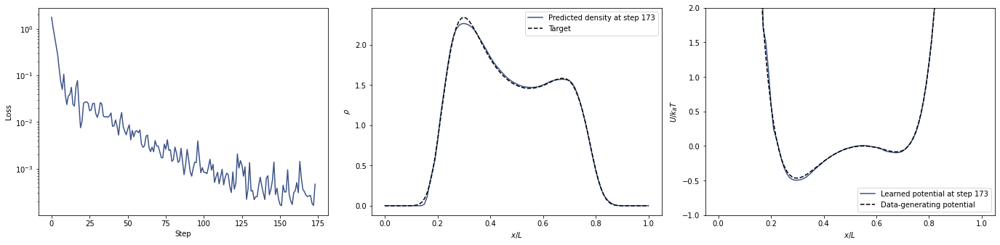

Step 174 in 2.97 sec loss =  0.0002372173 



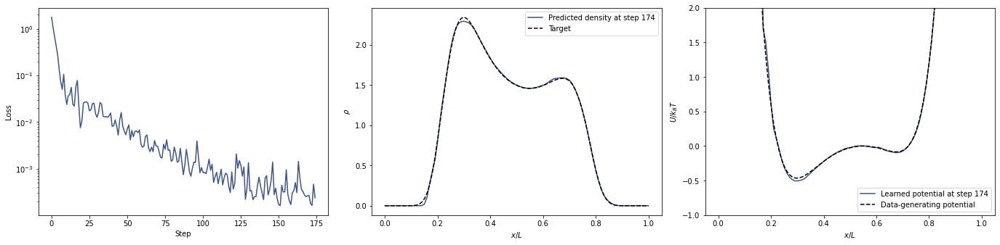

Step 175 in 38.66 sec loss =  0.00058115006 



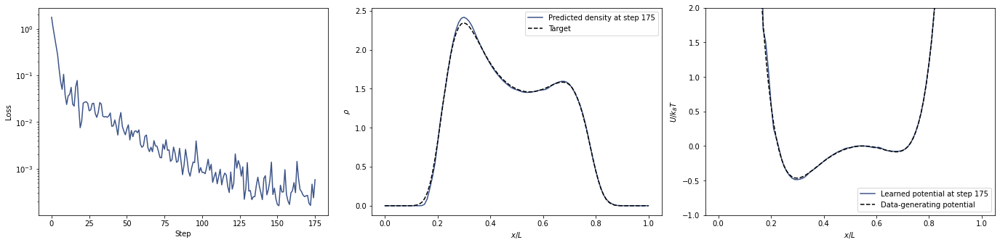

Step 176 in 2.54 sec loss =  0.0002887255 



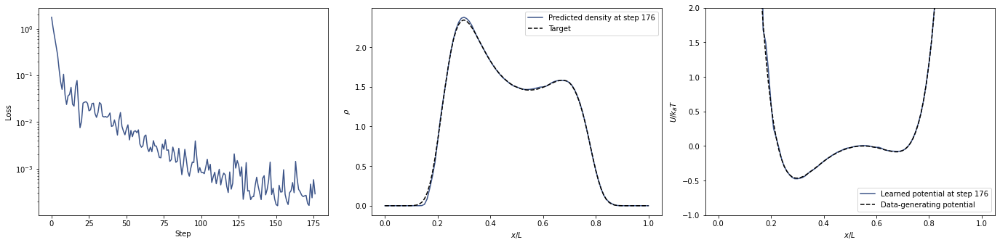

Step 177 in 39.19 sec loss =  0.00018449964 



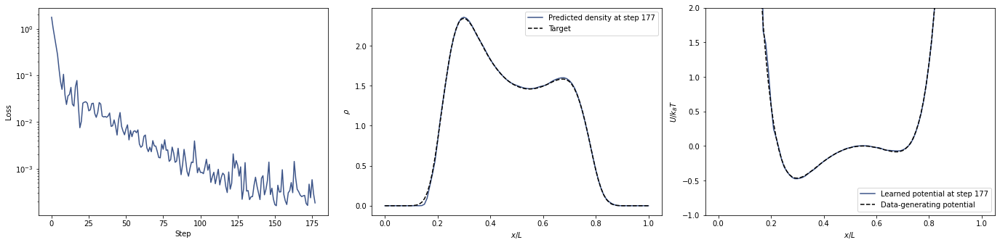

Step 178 in 2.55 sec loss =  0.00015929241 



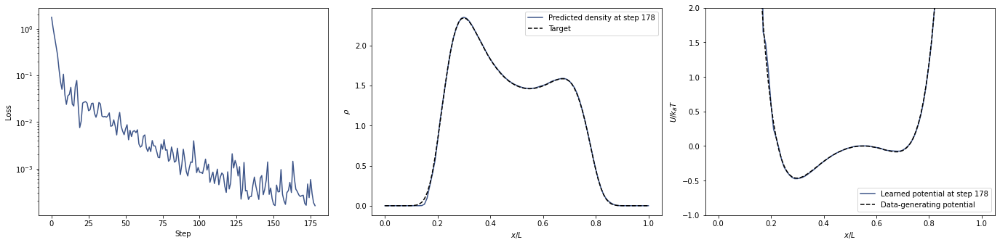

Step 179 in 2.96 sec loss =  0.00015159366 



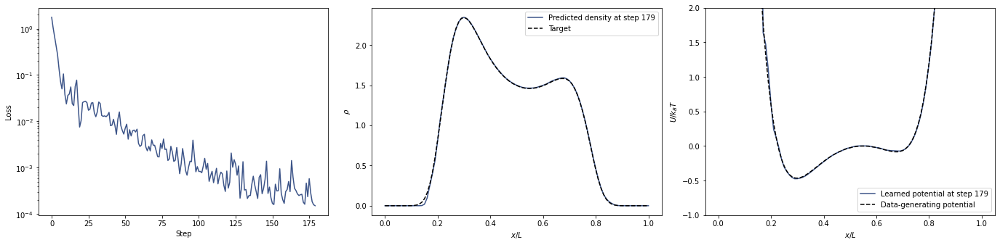

Step 180 in 2.72 sec loss =  0.00014767512 



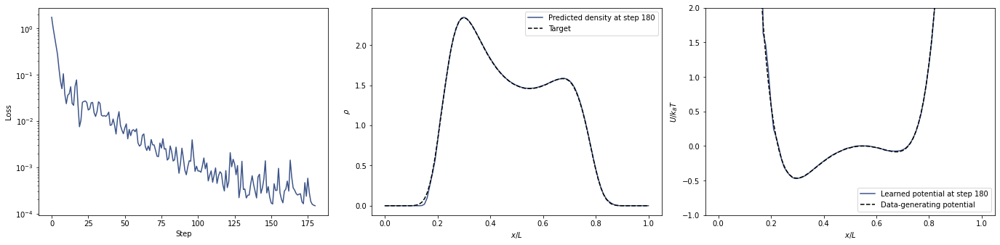

Step 181 in 2.85 sec loss =  0.00015702439 



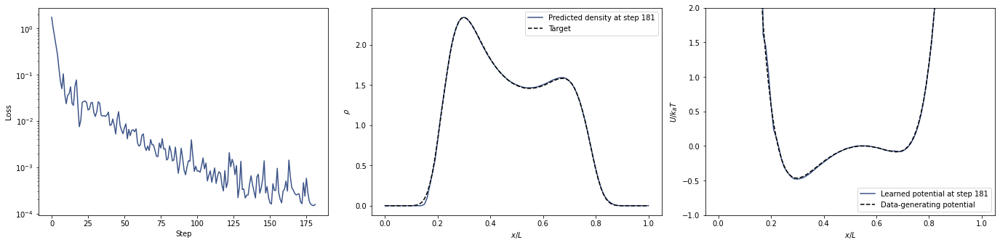

Step 182 in 2.72 sec loss =  0.00016437314 



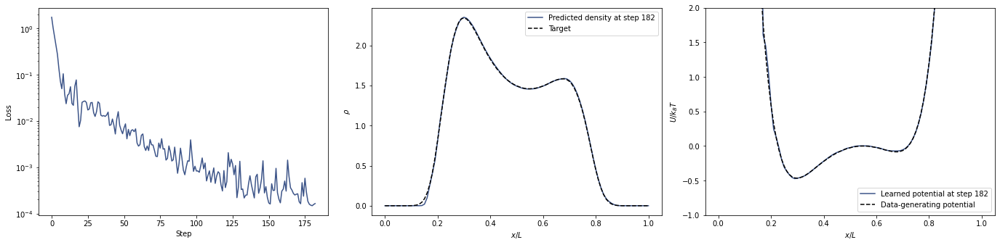

Step 183 in 2.87 sec loss =  0.00014519034 



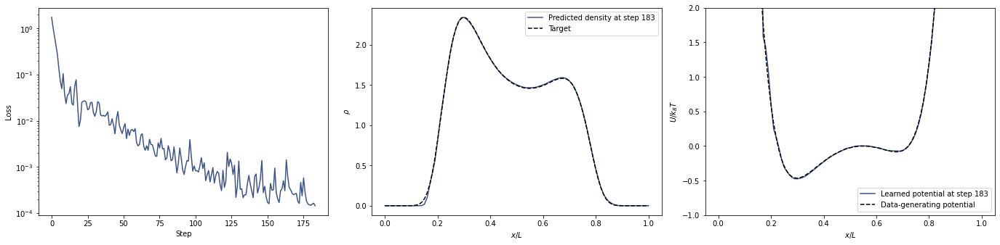

Step 184 in 2.86 sec loss =  0.00013764245 



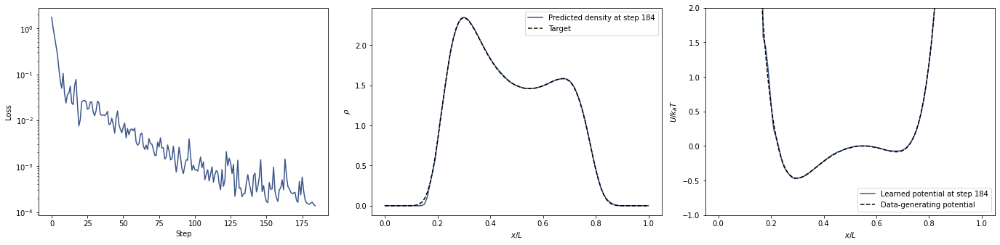

Step 185 in 2.99 sec loss =  0.00013750402 



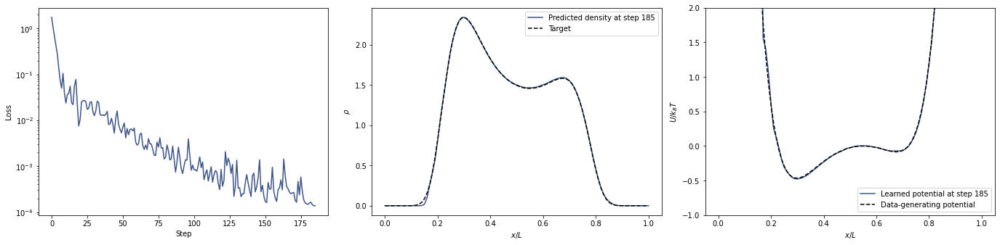

Step 186 in 39.09 sec loss =  0.0006473195 



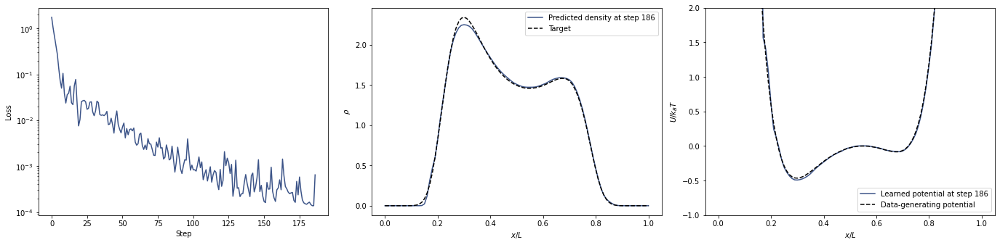

Step 187 in 2.88 sec loss =  0.00040364877 



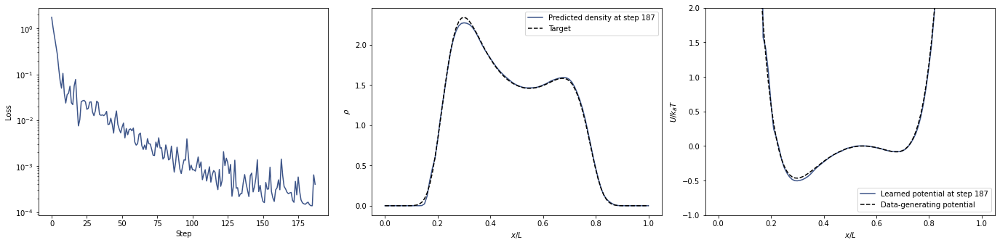

Step 188 in 39.58 sec loss =  0.00032949602 



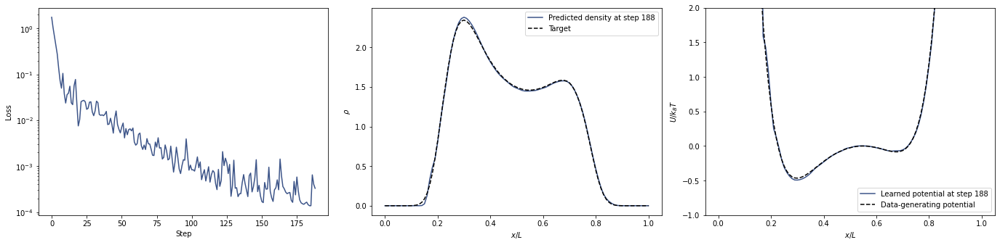

Step 189 in 3.02 sec loss =  0.00022375483 



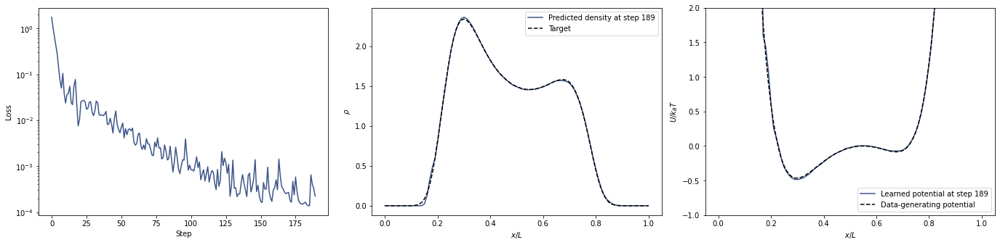

Step 190 in 2.96 sec loss =  0.00018132728 



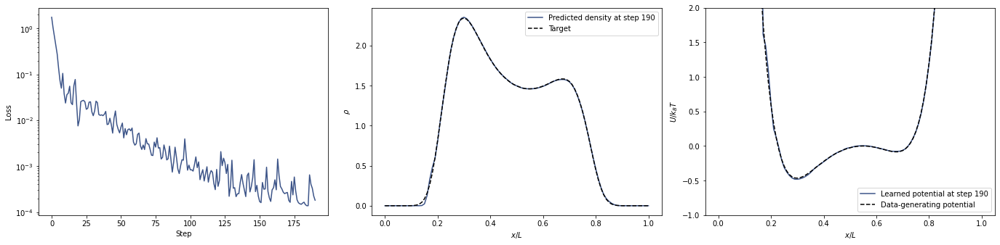

Step 191 in 2.94 sec loss =  0.00016940144 



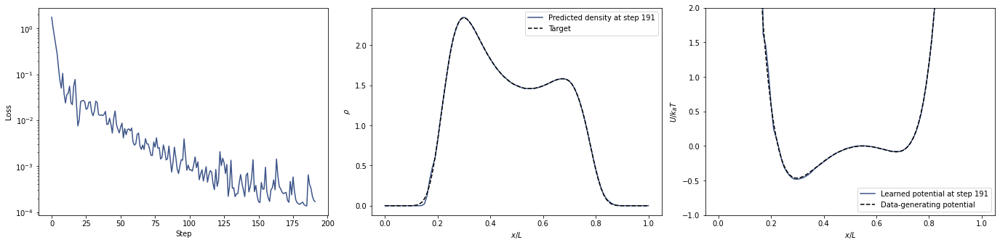

Step 192 in 39.16 sec loss =  0.00020298155 



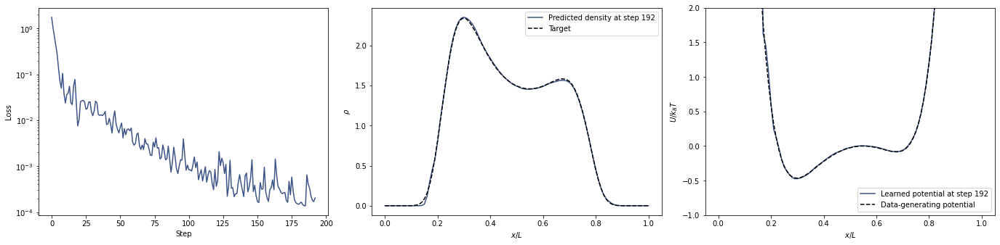

Step 193 in 2.99 sec loss =  0.00016291204 



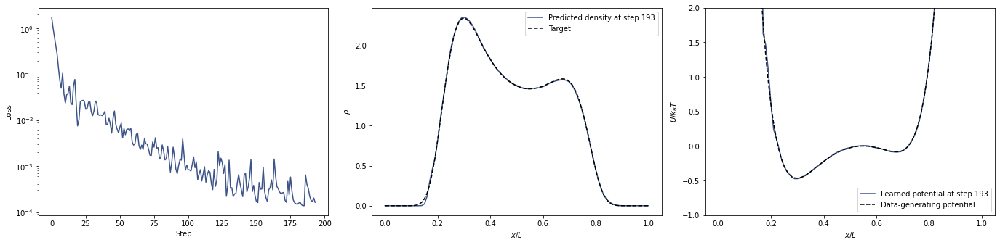

Step 194 in 2.59 sec loss =  0.00015154308 



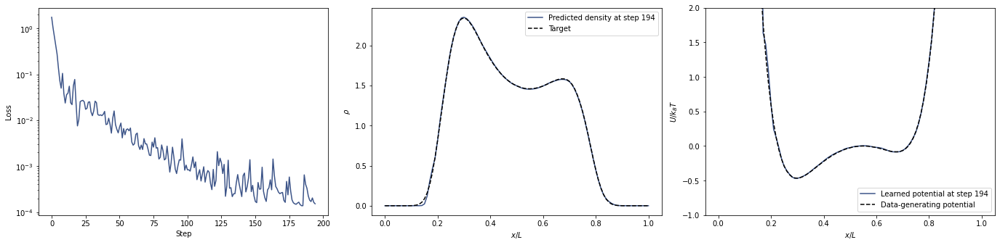

Step 195 in 2.46 sec loss =  0.00014893278 



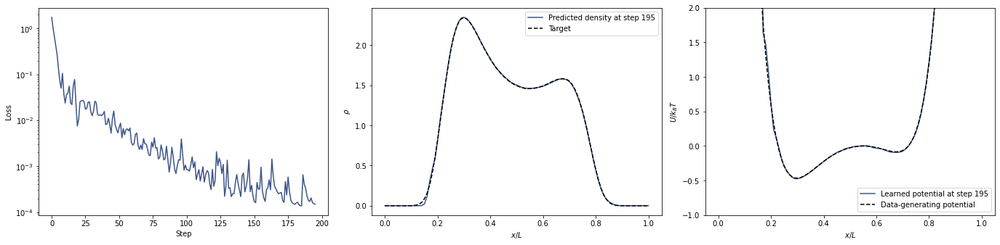

Step 196 in 3.01 sec loss =  0.00014720284 



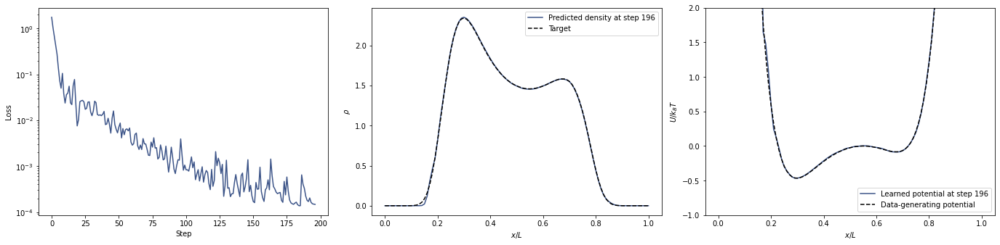

Step 197 in 2.99 sec loss =  0.00014787902 



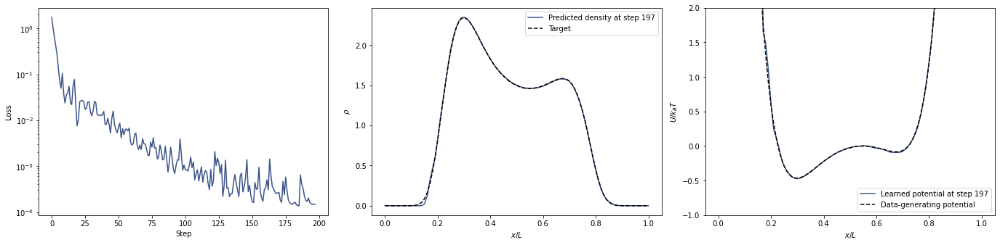

Step 198 in 2.72 sec loss =  0.00014738605 



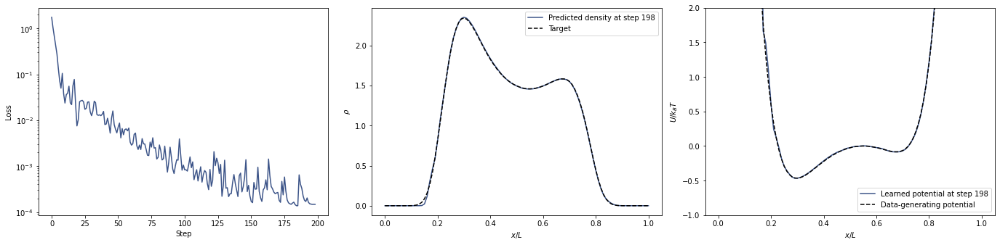

Step 199 in 2.85 sec loss =  0.00014466682 



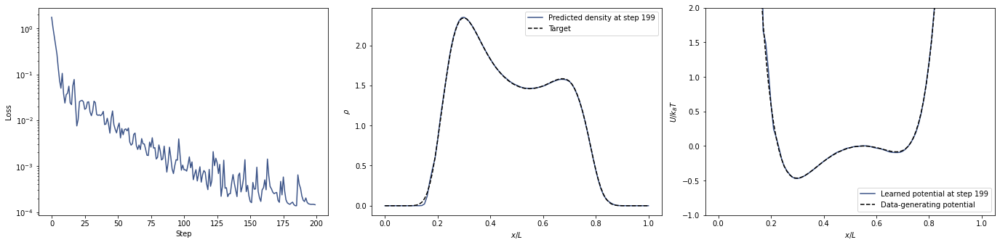

In [18]:
# save intermediate results for postprocessing
loss_history, predicted_densities, gradients, times_per_epoch, learned_potentials = [], [], [], [], []
intermediate_params = [init_params]

opt_state = optimizer.init(init_params)
params = init_params
traj_state = init_traj_state
num_updates = 200
for step in range(num_updates):
    start_time = time.time()
    params, opt_state, traj_state, curr_grad, loss_val, predicted_density = update(params, opt_state, traj_state)
    traj_state[0].position.block_until_ready()
    step_time = time.time() - start_time
    print("Step {} in {:0.2f} sec".format(step, step_time), 'loss = ', loss_val, '\n')

    times_per_epoch.append(step_time)
    loss_history.append(loss_val)
    gradients.append(curr_grad)
    intermediate_params.append(params)
    predicted_densities.append(predicted_density)
    cur_potential = potential_over_x(params)
    learned_potentials.append(cur_potential)
    plot_training_process(loss_history, x_vals, predicted_density, target_density, cur_potential,
                          analytic_potential_vals)


with open(optimization_save_str, 'wb') as f:
    pickle.dump([loss_history, gradients, x_vals, intermediate_params, predicted_densities, target_density,
                 times_per_epoch, analytic_potential_vals, learned_potentials], f)

In [19]:
# load results, if necessary
loss_history, gradients, x_vals, intermediate_params, predicted_densities, target_density, \
times_per_epoch, analytic_potential_vals, learned_potentials = pickle.load(open(optimization_save_str, 'rb'))


### Validation run

One should check that the learned potential also produces target observables
for long simulation runs. This ensures that the potential neither overfitted to initial conditions nor drifts away from
 the targets. This precaution is necessary given that the optimization was run on rather short equilibration and production times.

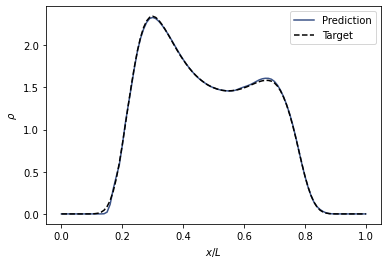

In [20]:
# Let's deliberately start from a state far from equilibrium
R_init = 0.01 * box * random.uniform(random.PRNGKey(123), (N, 1)) + box / 2.  # all particles in middle of box

predicted_energy_fn = energy_fn_template(jnp.array(intermediate_params[-1]))
init_sim, apply_fn = simulator_template(predicted_energy_fn)
init_state = init_sim(random.PRNGKey(456), R_init, mass=mass)
run_small_simulation = run_to_next_printout_fn(apply_fn, timesteps_per_printout)

equilibrated_state, _ = lax.scan(run_small_simulation, init_state, xs=jnp.arange(10000))  # equilibrate
_, long_traj = lax.scan(run_small_simulation, equilibrated_state, xs=jnp.arange(100000))

predicted_density_long = jnp.mean(compute_quantity_traj(long_traj, normalized_density_fn), axis=0)

plt.figure()
plt.plot(x_vals, predicted_density_long, label='Prediction', color='#3c5488ff')
plt.plot(x_vals, target_density, label='Target', linestyle='--', color='k')
plt.xlabel('$x / L$')
plt.ylabel(r'$\rho$')
plt.legend()
plt.show()

### Exploding Gradients

Unlike DiffTRe, direct backpropagation through the simulation suffers from exploding gradients for longer simulation runs:

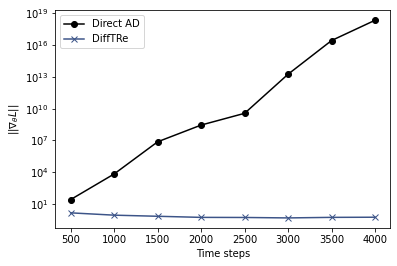

In [21]:
num_printout_states = jnp.arange(5, 41, 5)

direct_grads, DiffTRe_grads = [], []

init_state = init_traj_state[0]  # start from equilibrated state


for num_printouts in num_printout_states:
    
    @jit
    def loss_direct_backpropagation(energy_params, state):
        energy_fn = energy_fn_template(energy_params)
        _, apply_fn = simulator_template(energy_fn)
        run_small_simulation = run_to_next_printout_fn(apply_fn, timesteps_per_printout)
        new_state, traj = lax.scan(run_small_simulation, state, xs=jnp.arange(num_printouts))
        predicted_density = jnp.mean(compute_quantity_traj(traj, normalized_density_fn), axis=0)
        loss = mse_loss(predicted_density, target_density)
        return loss, predicted_density
    
    direct_grad, density = grad(loss_direct_backpropagation, has_aux=True)(init_params, init_state)
    direct_grads.append(direct_grad)
    
    @jit
    def generate_reference_trajectory(params, sim_state):
        # initialize simulation with current params / energy_fn
        energy_fn = energy_fn_template(params)
        _, apply_fn = simulator_template(energy_fn)
        run_small_simulation = run_to_next_printout_fn(apply_fn, timesteps_per_printout)

        # run simulation and compute energies
        new_sim_state, traj = lax.scan(run_small_simulation, sim_state, xs=jnp.arange(num_printouts))
        U_traj = compute_quantity_traj(traj, energy_fn)

        return new_sim_state, traj, U_traj
    
    traj_state = generate_reference_trajectory(init_params, init_state)
    DiffTre_grad, _ = grad(reweighting_loss, has_aux=True)(init_params, traj_state)
    DiffTRe_grads.append(DiffTre_grad)


direct_grad_magnitudes = tree_util.tree_map(jnp.linalg.norm, direct_grads)
DiffTRe_grad_magnitudes = tree_util.tree_map(jnp.linalg.norm, DiffTRe_grads)


plt.figure()
plt.semilogy(num_printout_states * timesteps_per_printout, direct_grad_magnitudes, label='Direct AD', color='k', marker='o')
plt.semilogy(num_printout_states * timesteps_per_printout, DiffTRe_grad_magnitudes, label='DiffTRe', marker='x', color='#3c5488ff')
plt.ylabel(r'$||\nabla_\theta L||$')
plt.xlabel('Time steps')
plt.legend()
plt.show()

with open(postprocessing_str, 'wb') as f:
    pickle.dump([predicted_density_long, num_printout_states, direct_grad_magnitudes, DiffTRe_grad_magnitudes], f)

### Speed-up

Finally, we can measure the speed-up DiffTRe achieves over directly backpropagating through the simulation.
Assuming an expensive potential energy function in real-world problems (e.g. a graph neural network), we can
provide a rough estimate of the expected speed-up $s$ by comparing how many force evaluations are necessary per retained state (see paper for details).

To simulate the practical use-case of an expensive energy function, we substitute the numerically cheap spline by a
neural network. For the expensive neural network, running on a GPU is advisable.

In [22]:
def NN_potential(layers, activation_fn=nn.swish):
    @hk.without_apply_rng
    @hk.transform
    def energy_model(R):
        nn_potential = vmap(hk.nets.MLP(output_sizes=layers, activation=activation_fn))  # map over all particles
        energies = nn_potential(R)
        return jnp.sum(energies)

    return energy_model.init, energy_model.apply

energy_init_fn, nn_energy = NN_potential([100, 100, 1])

def energy_fn_template(params):
    nn_energy_initialized = partial(nn_energy, params)

    def energy_initialized(R, t=0):
        return nn_energy_initialized(R) + prior_fn(R)
    return jit(energy_initialized)


num_dump = 1
num_printouts = 10  # more snapshots are infeasible: direct backpropagation computation runs out of memory fast

@partial(jit, backend='gpu')
def generate_reference_trajectory(params, sim_state):
    # initialize simulation with current params / energy_fn
    energy_fn = energy_fn_template(params)
    _, apply_fn = simulator_template(energy_fn)
    run_small_simulation = run_to_next_printout_fn(apply_fn, timesteps_per_printout)

    # run simulation and compute energies
    sim_state, _ = lax.scan(run_small_simulation, sim_state, xs=jnp.arange(num_dump))
    new_sim_state, traj = lax.scan(run_small_simulation, sim_state, xs=jnp.arange(num_printouts))
    U_traj = compute_quantity_traj(traj, energy_fn)

    return new_sim_state, traj, U_traj




@partial(jit, backend='gpu')
def loss_direct_backpropagation(energy_params, state):
    predicted_energy_fn = energy_fn_template(energy_params)
    _, apply_fn = simulator_template(predicted_energy_fn)
    run_small_simulation = run_to_next_printout_fn(apply_fn, timesteps_per_printout)
    equilibrated_state, _ = lax.scan(run_small_simulation, state, xs=jnp.arange(num_dump))  # equilibrate
    new_state, traj = lax.scan(run_small_simulation, equilibrated_state, xs=jnp.arange(num_printouts))
    predicted_density = jnp.mean(compute_quantity_traj(traj, normalized_density_fn), axis=0)
    loss = mse_loss(predicted_density, target_density)
    return loss, new_state


reweighting_loss = jit(reweighting_loss, backend='gpu')


ntrials = 102
skip = 2

times_per_direct_iteration, times_per_direct_forward_pass = [], []
times_per_difftre_iteration, times_per_traj_generation, times_per_difftre_gradient_forward = [], [], []
params = energy_init_fn(random.PRNGKey(789), R_init)
state = init_state
for i in range(ntrials):
    # direct backprop gradient computation
    start_time = time.time()
    direct_grad, state = grad(loss_direct_backpropagation, has_aux=True)(params, state)
    state.position.block_until_ready()
    times_per_direct_iteration.append(time.time() - start_time)
    

    # direct backprop gradient computation forward pass
    start_time = time.time()
    loss, state = loss_direct_backpropagation(params, state)
    state.position.block_until_ready()
    times_per_direct_forward_pass.append(time.time() - start_time)

    # DiffTRe trajectory generation
    start_time = time.time()
    traj_state = generate_reference_trajectory(params, state)
    traj_state[2].block_until_ready()
    times_per_traj_generation.append(time.time() - start_time)

    # DiffTRe gradient computation given trajectory
    start_time = time.time()
    difftre_grad, density = grad(reweighting_loss, has_aux=True)(params, traj_state)
    density.block_until_ready()
    times_per_difftre_iteration.append(time.time() - start_time)

    # DiffTRe gradient computation given trajectory forward pass
    start_time = time.time()
    loss, density = reweighting_loss(params, traj_state)
    density.block_until_ready()
    times_per_difftre_gradient_forward.append(time.time() - start_time)

    state = traj_state[0]

def compute_mean(list):
    return sum(list[skip:]) / (ntrials - skip)  # delete first 2 runs, which might be corrupted by jit-overhead

difftre_iteration_timing = compute_mean(times_per_difftre_iteration)
difftre_trajectory_generation_timing = compute_mean(times_per_traj_generation)
difftre_forward_loss_timing = compute_mean(times_per_difftre_gradient_forward)
direct_backprop_timing = compute_mean(times_per_direct_iteration)
direct_backprop_forward = compute_mean(times_per_direct_forward_pass)


print('Mean per direct backprop iteration:', direct_backprop_timing, 's')
print('Mean per direct backprop forward pass:', direct_backprop_forward, 's')
print('Mean per DiffTRe trajectory generation:', difftre_trajectory_generation_timing, 's')
print('Mean per DiffTRe reweighting iteration:', difftre_iteration_timing, 's')
print('Mean per DiffTRe reweighting forward pass', difftre_forward_loss_timing, 's')

print('DiffTRe gradient speedup:', (direct_backprop_timing - direct_backprop_forward) /
      (difftre_iteration_timing - difftre_forward_loss_timing))
print('DiffTRe overall speedup when re-using trajectory:', direct_backprop_timing / difftre_iteration_timing)
print('DiffTRe overal speedup without re-using trajectory:', direct_backprop_timing /
      (difftre_iteration_timing + difftre_trajectory_generation_timing))

Mean per direct backprop iteration: 2.510530774593353 s
Mean per direct backprop forward pass: 0.6668890476226806 s
Mean per DiffTRe trajectory generation: 0.6671113228797912 s
Mean per DiffTRe reweighting iteration: 0.004995582103729248 s
Mean per DiffTRe reweighting forward pass 0.0012012982368469238 s
DiffTRe gradient speedup: 485.8997881161565
DiffTRe overall speedup when re-using trajectory: 502.55019784765796
DiffTRe overal speedup without re-using trajectory: 3.7353146589900144
